### Imports

In [1]:
import pandas as pd
import numpy as np
import geopandas as gpd

In [2]:
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
import matplotlib.patches as mpatches

%matplotlib inline 
mpl.rcParams['figure.dpi'] = 300

In [3]:
from sklearn.preprocessing import Normalizer

In [4]:
from chart_studio import plotly
import plotly.figure_factory as ff

In [5]:
pd.options.display.max_rows = 4000
pd.options.display.max_columns = 4000

In [6]:
gov_arch_csv = '../data/v2/communities_data_prepped.csv'

In [7]:
gov_df = pd.read_csv(gov_arch_csv)

In [8]:
gov_df.head()

,Name,Institutions,Mechanism,Culture/Values/Norms,Notes,Time span,Time span: Start,Time span: End,Geography,Size,Source,Metanotes,Heterogeneity,FC comments,expert check,enforcement_mechanisms_include_seizing_of_property,decision_making_mechanisms_include_public_meetings,decision_making_mechanisms_include_power_fluidity,decision_making_mechanisms_include_petition,decision_making_mechanisms_include_veto,decision_making_mechanisms_include_representation,decision_making_mechanisms_include_rule_of_law,enforcement_mechanisms_include_appeal,enforcement_mechanisms_include_tribunal_court_,decision_making_mechanisms_include_kingchief-as-figurehead,enforcement_mechanisms_include_destruction_of_property,decision_making_mechanisms_include_remunerated_position,decision_making_mechanisms_include_voting,enforcement_mechanisms_include_mediation,access_mechanisms_include_matrilineality,decision_making_mechanisms_include_ratification_acclamation_only,decision_making_mechanisms_include_checks_and_balances,enforcement_mechanisms_include_judicial_review,access_mechanisms_include_patronage_for_office,decision_making_mechanisms_include_plurality_voting,access_mechanisms_include_age_boundaries,enforcement_mechanisms_include_monitoring,decision_making_mechanisms_include_dual-sex_political_system,decision_making_mechanisms_include_word_of_mouth,decision_making_mechanisms_include_assembly_central,enforcement_mechanisms_include_graduated_sanctions,access_mechanisms_include_blood_relations,decision_making_mechanisms_include_agenda_setting,enforcement_mechanisms_include_suspension_expulsion_ostracism_proscription,decision_making_mechanisms_include_group_voting,decision_making_mechanisms_include_consent,decision_making_mechanisms_include_autocratic_leader_unbound,access_mechanisms_include_life_appointment,access_mechanisms_include_heredity,decision_making_mechanisms_include_coalition,decision_making_mechanisms_include_assembly_elite,decision_making_mechanisms_include_delegation,decision_making_mechanisms_include_quorum,access_mechanisms_include_popularity_,decision_making_mechanisms_include_leader_first_among_equals,decision_making_mechanisms_include_balance_of_power,access_mechanisms_include_divine_right,decision_making_mechanisms_include_vote_by_proxy,access_mechanisms_include_co-optation,decision_making_mechanisms_include_constitution,enforcement_mechanisms_include_capital_punishment,decision_making_mechanisms_include_autocratic_leader_chief_bound,enforcement_mechanisms_include_jury_judge,decision_making_mechanisms_include_turnover_rotation,access_mechanisms_include_female_participation,decision_making_mechanisms_include_consultation,enforcement_mechanisms_include_self-help,decision_making_mechanisms_include_oath,decision_making_mechanisms_include_supermajority,decision_making_mechanisms_include_council_central_,decision_making_mechanisms_include_lobbying,enforcement_mechanisms_include_police,decision_making_mechanisms_include_alliance,access_mechanisms_include_election,enforcement_mechanisms_include_reputational_risk,enforcement_mechanisms_include_paying_damages_compensation,access_mechanisms_include_screening_process,access_mechanisms_include_gerontocracy,access_mechanisms_include_payment_for_occupying_office,decision_making_mechanisms_include_board_committee,access_mechanisms_include_property_requirement,enforcement_mechanisms_include_negotiation,decision_making_mechanisms_include_secret_ballot,decision_making_mechanisms_include_gathering,enforcement_mechanisms_include_criticism_mocking_joking,decision_making_mechanisms_include_unanimity,decision_making_mechanisms_include_frequent_and_or_regular_meetings,decision_making_mechanisms_include_majority_voting,decision_making_mechanisms_include_consensus,decision_making_mechanisms_include_vote_by_show_of_hands,decision_making_mechanisms_include_bureaucracy,access_mechanisms_include_enfranchisement,enforcement_mechanisms_include_civil_disobedience,decision_making_mechanisms_include_assembly_local,access_mecha

# Councils, Courts Analysis 

In [9]:
col_list = list(gov_df.columns.values)
col_list

['Name',
 'Institutions',
 'Mechanism',
 'Culture/Values/Norms',
 'Notes',
 'Time span',
 'Time span: Start',
 'Time span: End',
 'Geography',
 'Size',
 'Source',
 'Metanotes',
 'Heterogeneity ',
 'FC comments',
 'expert check',
 'enforcement_mechanisms_include_seizing_of_property',
 'decision_making_mechanisms_include_public_meetings',
 'decision_making_mechanisms_include_power_fluidity',
 'decision_making_mechanisms_include_petition',
 'decision_making_mechanisms_include_veto',
 'decision_making_mechanisms_include_representation',
 'decision_making_mechanisms_include_rule_of_law',
 'enforcement_mechanisms_include_appeal',
 'enforcement_mechanisms_include_tribunal_court_',
 'decision_making_mechanisms_include_kingchief-as-figurehead',
 'enforcement_mechanisms_include_destruction_of_property',
 'decision_making_mechanisms_include_remunerated_position',
 'decision_making_mechanisms_include_voting',
 'enforcement_mechanisms_include_mediation',
 'access_mechanisms_include_matrilineality',

In [10]:
council_cols = [
    'decision_making_mechanisms_include_council_local',
    'decision_making_mechanisms_include_council_central_'
]

In [11]:
court_col = ['enforcement_mechanisms_include_tribunal_court_']

In [12]:
local_councils_df = gov_df[(gov_df['decision_making_mechanisms_include_council_local'] == 1)]

In [13]:
local_councils_df[['Name', 'Institutions', 'Mechanism']]

,Name,Institutions,Mechanism
10,Central African communities,"Big man,Council,ngongo munene","Leader (first among equals),Heredity,Matriline..."
15,Dutch Republic,"Vroedschap,Magistracies (WEST),Stadholder,Stat...","Assembly (central),Confederacy,Turnover/rotati..."
17,Egypt,"Pharaoh,Vizier (t3.ty),'Overseer of the Treasu...","Petition,Autocratic Leader (unbound),Divine ri..."
24,Haudenosanee (Iroquois),"Local clan houses,Women's clan council,Men's g...","Matriarchy,Consensus,Council (central) ,Judici..."
27,Huron,"Captain,Village council,Tribal chief,Tribe cou...","Gerontocracy,Election,Plurality voting,Meritoc..."
33,Japan (Early Modern),"Shogun,Daimyo,Village Council,Samurai,Emperor,...","Consensus,Election,Council (local),Lottery/Ran..."
34,Kachin gumlao,"mung,Council of Elders,agyi,bawmung","Autocratic Leader/Chief (bound),Checks and bal..."
35,Khasi,"Mother,Ka Khatduh,U Kni,Durbar Iing,Durbar Kur...","Matriarchy,Blood relations,Matrilineality,Cons..."
37,M’zab,"Ra’Is,Jama’a ,Makaris,dar al-'achira,Azzaba,Un...","Council (central) ,Council (local),Representat..."
39,Mari,"Šapitum,Sugagum,Merhum,Laputtum,Halsums,Yamini...","Autocratic Leader/Chief (bound),Consent,Magist..."


In [14]:
local_councils_df.describe()

,Time span: Start,Time span: End,enforcement_mechanisms_include_seizing_of_property,decision_making_mechanisms_include_public_meetings,decision_making_mechanisms_include_power_fluidity,decision_making_mechanisms_include_petition,decision_making_mechanisms_include_veto,decision_making_mechanisms_include_representation,decision_making_mechanisms_include_rule_of_law,enforcement_mechanisms_include_appeal,enforcement_mechanisms_include_tribunal_court_,decision_making_mechanisms_include_kingchief-as-figurehead,enforcement_mechanisms_include_destruction_of_property,decision_making_mechanisms_include_remunerated_position,decision_making_mechanisms_include_voting,enforcement_mechanisms_include_mediation,access_mechanisms_include_matrilineality,decision_making_mechanisms_include_ratification_acclamation_only,decision_making_mechanisms_include_checks_and_balances,enforcement_mechanisms_include_judicial_review,access_mechanisms_include_patronage_for_office,decision_making_mechanisms_include_plurality_voting,access_mechanisms_include_age_boundaries,enforcement_mechanisms_include_monitoring,decision_making_mechanisms_include_dual-sex_political_system,decision_making_mechanisms_include_word_of_mouth,decision_making_mechanisms_include_assembly_central,enforcement_mechanisms_include_graduated_sanctions,access_mechanisms_include_blood_relations,decision_making_mechanisms_include_agenda_setting,enforcement_mechanisms_include_suspension_expulsion_ostracism_proscription,decision_making_mechanisms_include_group_voting,decision_making_mechanisms_include_consent,decision_making_mechanisms_include_autocratic_leader_unbound,access_mechanisms_include_life_appointment,access_mechanisms_include_heredity,decision_making_mechanisms_include_coalition,decision_making_mechanisms_include_assembly_elite,decision_making_mechanisms_include_delegation,decision_making_mechanisms_include_quorum,access_mechanisms_include_popularity_,decision_making_mechanisms_include_leader_first_among_equals,decision_making_mechanisms_include_balance_of_power,access_mechanisms_include_divine_right,decision_making_mechanisms_include_vote_by_proxy,access_mechanisms_include_co-optation,decision_making_mechanisms_include_constitution,enforcement_mechanisms_include_capital_punishment,decision_making_mechanisms_include_autocratic_leader_chief_bound,enforcement_mechanisms_include_jury_judge,decision_making_mechanisms_include_turnover_rotation,access_mechanisms_include_female_participation,decision_making_mechanisms_include_consultation,enforcement_mechanisms_include_self-help,decision_making_mechanisms_include_oath,decision_making_mechanisms_include_supermajority,decision_making_mechanisms_include_council_central_,decision_making_mechanisms_include_lobbying,enforcement_mechanisms_include_police,decision_making_mechanisms_include_alliance,access_mechanisms_include_election,enforcement_mechanisms_include_reputational_risk,enforcement_mechanisms_include_paying_damages_compensation,access_mechanisms_include_screening_process,access_mechanisms_include_gerontocracy,access_mechanisms_include_payment_for_occupying_office,decision_making_mechanisms_include_board_committee,access_mechanisms_include_property_requirement,enforcement_mechanisms_include_negotiation,decision_making_mechanisms_include_secret_ballot,decision_making_mechanisms_include_gathering,enforcement_mechanisms_include_criticism_mocking_joking,decision_making_mechanisms_include_unanimity,decision_making_mechanisms_include_frequent_and_or_regular_meetings,decision_making_mechanisms_include_majority_voting,decision_making_mechanisms_include_consensus,decision_making_mechanisms_include_vote_by_show_of_hands,decision_making_mechanisms_include_bureaucracy,access_mechanisms_include_enfranchisement,enforcement_mechanisms_include_civil_disobedience,decision_making_mechanisms_include_assembly_local,access_mechanisms_include_open_political_unit,decision_making_mechanisms_include_deliberation,decision_making_mechanisms_include_temporary_position_

In [15]:
local_councils_df = gov_df[(gov_df['decision_making_mechanisms_include_council_local'] == 1)]

In [16]:
local_councils_df

,Name,Institutions,Mechanism,Culture/Values/Norms,Notes,Time span,Time span: Start,Time span: End,Geography,Size,Source,Metanotes,Heterogeneity,FC comments,expert check,enforcement_mechanisms_include_seizing_of_property,decision_making_mechanisms_include_public_meetings,decision_making_mechanisms_include_power_fluidity,decision_making_mechanisms_include_petition,decision_making_mechanisms_include_veto,decision_making_mechanisms_include_representation,decision_making_mechanisms_include_rule_of_law,enforcement_mechanisms_include_appeal,enforcement_mechanisms_include_tribunal_court_,decision_making_mechanisms_include_kingchief-as-figurehead,enforcement_mechanisms_include_destruction_of_property,decision_making_mechanisms_include_remunerated_position,decision_making_mechanisms_include_voting,enforcement_mechanisms_include_mediation,access_mechanisms_include_matrilineality,decision_making_mechanisms_include_ratification_acclamation_only,decision_making_mechanisms_include_checks_and_balances,enforcement_mechanisms_include_judicial_review,access_mechanisms_include_patronage_for_office,decision_making_mechanisms_include_plurality_voting,access_mechanisms_include_age_boundaries,enforcement_mechanisms_include_monitoring,decision_making_mechanisms_include_dual-sex_political_system,decision_making_mechanisms_include_word_of_mouth,decision_making_mechanisms_include_assembly_central,enforcement_mechanisms_include_graduated_sanctions,access_mechanisms_include_blood_relations,decision_making_mechanisms_include_agenda_setting,enforcement_mechanisms_include_suspension_expulsion_ostracism_proscription,decision_making_mechanisms_include_group_voting,decision_making_mechanisms_include_consent,decision_making_mechanisms_include_autocratic_leader_unbound,access_mechanisms_include_life_appointment,access_mechanisms_include_heredity,decision_making_mechanisms_include_coalition,decision_making_mechanisms_include_assembly_elite,decision_making_mechanisms_include_delegation,decision_making_mechanisms_include_quorum,access_mechanisms_include_popularity_,decision_making_mechanisms_include_leader_first_among_equals,decision_making_mechanisms_include_balance_of_power,access_mechanisms_include_divine_right,decision_making_mechanisms_include_vote_by_proxy,access_mechanisms_include_co-optation,decision_making_mechanisms_include_constitution,enforcement_mechanisms_include_capital_punishment,decision_making_mechanisms_include_autocratic_leader_chief_bound,enforcement_mechanisms_include_jury_judge,decision_making_mechanisms_include_turnover_rotation,access_mechanisms_include_female_participation,decision_making_mechanisms_include_consultation,enforcement_mechanisms_include_self-help,decision_making_mechanisms_include_oath,decision_making_mechanisms_include_supermajority,decision_making_mechanisms_include_council_central_,decision_making_mechanisms_include_lobbying,enforcement_mechanisms_include_police,decision_making_mechanisms_include_alliance,access_mechanisms_include_election,enforcement_mechanisms_include_reputational_risk,enforcement_mechanisms_include_paying_damages_compensation,access_mechanisms_include_screening_process,access_mechanisms_include_gerontocracy,access_mechanisms_include_payment_for_occupying_office,decision_making_mechanisms_include_board_committee,access_mechanisms_include_property_requirement,enforcement_mechanisms_include_negotiation,decision_making_mechanisms_include_secret_ballot,decision_making_mechanisms_include_gathering,enforcement_mechanisms_include_criticism_mocking_joking,decision_making_mechanisms_include_unanimity,decision_making_mechanisms_include_frequent_and_or_regular_meetings,decision_making_mechanisms_include_majority_voting,decision_making_mechanisms_include_consensus,decision_making_mechanisms_include_vote_by_show_of_hands,decision_making_mechanisms_include_bureaucracy,access_mechanisms_include_enfranchisement,enforcement_mechanisms_include_civil_disobedience,decision_making_mechanisms_include_assembly_local,access_mecha

In [17]:
central_councils_df = gov_df[(gov_df['decision_making_mechanisms_include_council_central_'] == 1)]

In [18]:
central_councils_df[['Name', 'Institutions', 'Mechanism']]

,Name,Institutions,Mechanism
1,Aedui (Celtic Oppida),"Senatus,Elected magistrates,Assemblies","Election,Council (central) ,Assembly (central)..."
2,Akha,"Council of Elders,Village Founder-Leader (dzom...","Leader (first among equals),Gerontocracy,Blood..."
3,Amalfi,"Prefetturii/ Conti/ Dogi,Sedile di congrega,Ta...","Election,Magistrate/official,Heredity,Constitu..."
6,Athens (Classical Period),"Council of Five Hundred (Boule),Areopagus,Ekkl...","Election,Plurality voting,Temporary position o..."
7,Aztec City-States,"Tlatoani,Council of high nobles","Autocratic Leader/Chief (bound),Heredity,Merit..."
8,Babylonia,"Governor,Council of Elders,The citizens/The As...","Assembly (central),Checks and balances,Consent..."
9,Carthage,"Rab kohanim,Council of Elders,Tribunal of 104,...","Blood relations,Tribunal/Court ,Suspension/Exp..."
12,Circassians,Council of Matriarchs,"Council (central) ,Gerontocracy,Matriarchy,Fem..."
13,Cologne,"Rentmeister,City council,Rentkammern","Co-optation,Temporary position of power/Term L..."
16,Ebla,"En (malkum),Ø,Lugal,Abba,Notables/ Officials,L...","Autocratic Leader/Chief (bound),Council (centr..."


In [19]:
court_df = gov_df[(gov_df['enforcement_mechanisms_include_tribunal_court_'] == 1)] 

In [20]:
court_df

,Name,Institutions,Mechanism,Culture/Values/Norms,Notes,Time span,Time span: Start,Time span: End,Geography,Size,Source,Metanotes,Heterogeneity,FC comments,expert check,enforcement_mechanisms_include_seizing_of_property,decision_making_mechanisms_include_public_meetings,decision_making_mechanisms_include_power_fluidity,decision_making_mechanisms_include_petition,decision_making_mechanisms_include_veto,decision_making_mechanisms_include_representation,decision_making_mechanisms_include_rule_of_law,enforcement_mechanisms_include_appeal,enforcement_mechanisms_include_tribunal_court_,decision_making_mechanisms_include_kingchief-as-figurehead,enforcement_mechanisms_include_destruction_of_property,decision_making_mechanisms_include_remunerated_position,decision_making_mechanisms_include_voting,enforcement_mechanisms_include_mediation,access_mechanisms_include_matrilineality,decision_making_mechanisms_include_ratification_acclamation_only,decision_making_mechanisms_include_checks_and_balances,enforcement_mechanisms_include_judicial_review,access_mechanisms_include_patronage_for_office,decision_making_mechanisms_include_plurality_voting,access_mechanisms_include_age_boundaries,enforcement_mechanisms_include_monitoring,decision_making_mechanisms_include_dual-sex_political_system,decision_making_mechanisms_include_word_of_mouth,decision_making_mechanisms_include_assembly_central,enforcement_mechanisms_include_graduated_sanctions,access_mechanisms_include_blood_relations,decision_making_mechanisms_include_agenda_setting,enforcement_mechanisms_include_suspension_expulsion_ostracism_proscription,decision_making_mechanisms_include_group_voting,decision_making_mechanisms_include_consent,decision_making_mechanisms_include_autocratic_leader_unbound,access_mechanisms_include_life_appointment,access_mechanisms_include_heredity,decision_making_mechanisms_include_coalition,decision_making_mechanisms_include_assembly_elite,decision_making_mechanisms_include_delegation,decision_making_mechanisms_include_quorum,access_mechanisms_include_popularity_,decision_making_mechanisms_include_leader_first_among_equals,decision_making_mechanisms_include_balance_of_power,access_mechanisms_include_divine_right,decision_making_mechanisms_include_vote_by_proxy,access_mechanisms_include_co-optation,decision_making_mechanisms_include_constitution,enforcement_mechanisms_include_capital_punishment,decision_making_mechanisms_include_autocratic_leader_chief_bound,enforcement_mechanisms_include_jury_judge,decision_making_mechanisms_include_turnover_rotation,access_mechanisms_include_female_participation,decision_making_mechanisms_include_consultation,enforcement_mechanisms_include_self-help,decision_making_mechanisms_include_oath,decision_making_mechanisms_include_supermajority,decision_making_mechanisms_include_council_central_,decision_making_mechanisms_include_lobbying,enforcement_mechanisms_include_police,decision_making_mechanisms_include_alliance,access_mechanisms_include_election,enforcement_mechanisms_include_reputational_risk,enforcement_mechanisms_include_paying_damages_compensation,access_mechanisms_include_screening_process,access_mechanisms_include_gerontocracy,access_mechanisms_include_payment_for_occupying_office,decision_making_mechanisms_include_board_committee,access_mechanisms_include_property_requirement,enforcement_mechanisms_include_negotiation,decision_making_mechanisms_include_secret_ballot,decision_making_mechanisms_include_gathering,enforcement_mechanisms_include_criticism_mocking_joking,decision_making_mechanisms_include_unanimity,decision_making_mechanisms_include_frequent_and_or_regular_meetings,decision_making_mechanisms_include_majority_voting,decision_making_mechanisms_include_consensus,decision_making_mechanisms_include_vote_by_show_of_hands,decision_making_mechanisms_include_bureaucracy,access_mechanisms_include_enfranchisement,enforcement_mechanisms_include_civil_disobedience,decision_making_mechanisms_include_assembly_local,access_mecha

In [21]:
court_df.describe()

,Time span: Start,Time span: End,enforcement_mechanisms_include_seizing_of_property,decision_making_mechanisms_include_public_meetings,decision_making_mechanisms_include_power_fluidity,decision_making_mechanisms_include_petition,decision_making_mechanisms_include_veto,decision_making_mechanisms_include_representation,decision_making_mechanisms_include_rule_of_law,enforcement_mechanisms_include_appeal,enforcement_mechanisms_include_tribunal_court_,decision_making_mechanisms_include_kingchief-as-figurehead,enforcement_mechanisms_include_destruction_of_property,decision_making_mechanisms_include_remunerated_position,decision_making_mechanisms_include_voting,enforcement_mechanisms_include_mediation,access_mechanisms_include_matrilineality,decision_making_mechanisms_include_ratification_acclamation_only,decision_making_mechanisms_include_checks_and_balances,enforcement_mechanisms_include_judicial_review,access_mechanisms_include_patronage_for_office,decision_making_mechanisms_include_plurality_voting,access_mechanisms_include_age_boundaries,enforcement_mechanisms_include_monitoring,decision_making_mechanisms_include_dual-sex_political_system,decision_making_mechanisms_include_word_of_mouth,decision_making_mechanisms_include_assembly_central,enforcement_mechanisms_include_graduated_sanctions,access_mechanisms_include_blood_relations,decision_making_mechanisms_include_agenda_setting,enforcement_mechanisms_include_suspension_expulsion_ostracism_proscription,decision_making_mechanisms_include_group_voting,decision_making_mechanisms_include_consent,decision_making_mechanisms_include_autocratic_leader_unbound,access_mechanisms_include_life_appointment,access_mechanisms_include_heredity,decision_making_mechanisms_include_coalition,decision_making_mechanisms_include_assembly_elite,decision_making_mechanisms_include_delegation,decision_making_mechanisms_include_quorum,access_mechanisms_include_popularity_,decision_making_mechanisms_include_leader_first_among_equals,decision_making_mechanisms_include_balance_of_power,access_mechanisms_include_divine_right,decision_making_mechanisms_include_vote_by_proxy,access_mechanisms_include_co-optation,decision_making_mechanisms_include_constitution,enforcement_mechanisms_include_capital_punishment,decision_making_mechanisms_include_autocratic_leader_chief_bound,enforcement_mechanisms_include_jury_judge,decision_making_mechanisms_include_turnover_rotation,access_mechanisms_include_female_participation,decision_making_mechanisms_include_consultation,enforcement_mechanisms_include_self-help,decision_making_mechanisms_include_oath,decision_making_mechanisms_include_supermajority,decision_making_mechanisms_include_council_central_,decision_making_mechanisms_include_lobbying,enforcement_mechanisms_include_police,decision_making_mechanisms_include_alliance,access_mechanisms_include_election,enforcement_mechanisms_include_reputational_risk,enforcement_mechanisms_include_paying_damages_compensation,access_mechanisms_include_screening_process,access_mechanisms_include_gerontocracy,access_mechanisms_include_payment_for_occupying_office,decision_making_mechanisms_include_board_committee,access_mechanisms_include_property_requirement,enforcement_mechanisms_include_negotiation,decision_making_mechanisms_include_secret_ballot,decision_making_mechanisms_include_gathering,enforcement_mechanisms_include_criticism_mocking_joking,decision_making_mechanisms_include_unanimity,decision_making_mechanisms_include_frequent_and_or_regular_meetings,decision_making_mechanisms_include_majority_voting,decision_making_mechanisms_include_consensus,decision_making_mechanisms_include_vote_by_show_of_hands,decision_making_mechanisms_include_bureaucracy,access_mechanisms_include_enfranchisement,enforcement_mechanisms_include_civil_disobedience,decision_making_mechanisms_include_assembly_local,access_mechanisms_include_open_political_unit,decision_making_mechanisms_include_deliberation,decision_making_mechanisms_include_temporary_position_

In [22]:
council_df = gov_df[(
    (gov_df['decision_making_mechanisms_include_council_local'] == 1) |
    (gov_df['decision_making_mechanisms_include_council_central_'] == 1)
)]

In [23]:
council_df[council_cols]

,decision_making_mechanisms_include_council_local,decision_making_mechanisms_include_council_central_
1,0,1
2,0,1
3,0,1
6,0,1
7,0,1
8,0,1
9,0,1
10,1,0
12,0,1
13,0,1


In [24]:
council_df.describe()

,Time span: Start,Time span: End,enforcement_mechanisms_include_seizing_of_property,decision_making_mechanisms_include_public_meetings,decision_making_mechanisms_include_power_fluidity,decision_making_mechanisms_include_petition,decision_making_mechanisms_include_veto,decision_making_mechanisms_include_representation,decision_making_mechanisms_include_rule_of_law,enforcement_mechanisms_include_appeal,enforcement_mechanisms_include_tribunal_court_,decision_making_mechanisms_include_kingchief-as-figurehead,enforcement_mechanisms_include_destruction_of_property,decision_making_mechanisms_include_remunerated_position,decision_making_mechanisms_include_voting,enforcement_mechanisms_include_mediation,access_mechanisms_include_matrilineality,decision_making_mechanisms_include_ratification_acclamation_only,decision_making_mechanisms_include_checks_and_balances,enforcement_mechanisms_include_judicial_review,access_mechanisms_include_patronage_for_office,decision_making_mechanisms_include_plurality_voting,access_mechanisms_include_age_boundaries,enforcement_mechanisms_include_monitoring,decision_making_mechanisms_include_dual-sex_political_system,decision_making_mechanisms_include_word_of_mouth,decision_making_mechanisms_include_assembly_central,enforcement_mechanisms_include_graduated_sanctions,access_mechanisms_include_blood_relations,decision_making_mechanisms_include_agenda_setting,enforcement_mechanisms_include_suspension_expulsion_ostracism_proscription,decision_making_mechanisms_include_group_voting,decision_making_mechanisms_include_consent,decision_making_mechanisms_include_autocratic_leader_unbound,access_mechanisms_include_life_appointment,access_mechanisms_include_heredity,decision_making_mechanisms_include_coalition,decision_making_mechanisms_include_assembly_elite,decision_making_mechanisms_include_delegation,decision_making_mechanisms_include_quorum,access_mechanisms_include_popularity_,decision_making_mechanisms_include_leader_first_among_equals,decision_making_mechanisms_include_balance_of_power,access_mechanisms_include_divine_right,decision_making_mechanisms_include_vote_by_proxy,access_mechanisms_include_co-optation,decision_making_mechanisms_include_constitution,enforcement_mechanisms_include_capital_punishment,decision_making_mechanisms_include_autocratic_leader_chief_bound,enforcement_mechanisms_include_jury_judge,decision_making_mechanisms_include_turnover_rotation,access_mechanisms_include_female_participation,decision_making_mechanisms_include_consultation,enforcement_mechanisms_include_self-help,decision_making_mechanisms_include_oath,decision_making_mechanisms_include_supermajority,decision_making_mechanisms_include_council_central_,decision_making_mechanisms_include_lobbying,enforcement_mechanisms_include_police,decision_making_mechanisms_include_alliance,access_mechanisms_include_election,enforcement_mechanisms_include_reputational_risk,enforcement_mechanisms_include_paying_damages_compensation,access_mechanisms_include_screening_process,access_mechanisms_include_gerontocracy,access_mechanisms_include_payment_for_occupying_office,decision_making_mechanisms_include_board_committee,access_mechanisms_include_property_requirement,enforcement_mechanisms_include_negotiation,decision_making_mechanisms_include_secret_ballot,decision_making_mechanisms_include_gathering,enforcement_mechanisms_include_criticism_mocking_joking,decision_making_mechanisms_include_unanimity,decision_making_mechanisms_include_frequent_and_or_regular_meetings,decision_making_mechanisms_include_majority_voting,decision_making_mechanisms_include_consensus,decision_making_mechanisms_include_vote_by_show_of_hands,decision_making_mechanisms_include_bureaucracy,access_mechanisms_include_enfranchisement,enforcement_mechanisms_include_civil_disobedience,decision_making_mechanisms_include_assembly_local,access_mechanisms_include_open_political_unit,decision_making_mechanisms_include_deliberation,decision_making_mechanisms_include_temporary_position_

In [25]:
council_df[council_cols].describe()

,decision_making_mechanisms_include_council_local,decision_making_mechanisms_include_council_central_
count,49.000000,49.000000
mean,0.346939,0.755102
std,0.480929,0.434483
min,0.000000,0.000000
25%,0.000000,1.000000
50%,0.000000,1.000000
75%,1.000000,1.000000
max,1.000000,1.000000


In [26]:
council_df[council_cols].sum()

decision_making_mechanisms_include_council_local       17
decision_making_mechanisms_include_council_central_    37
dtype: int64

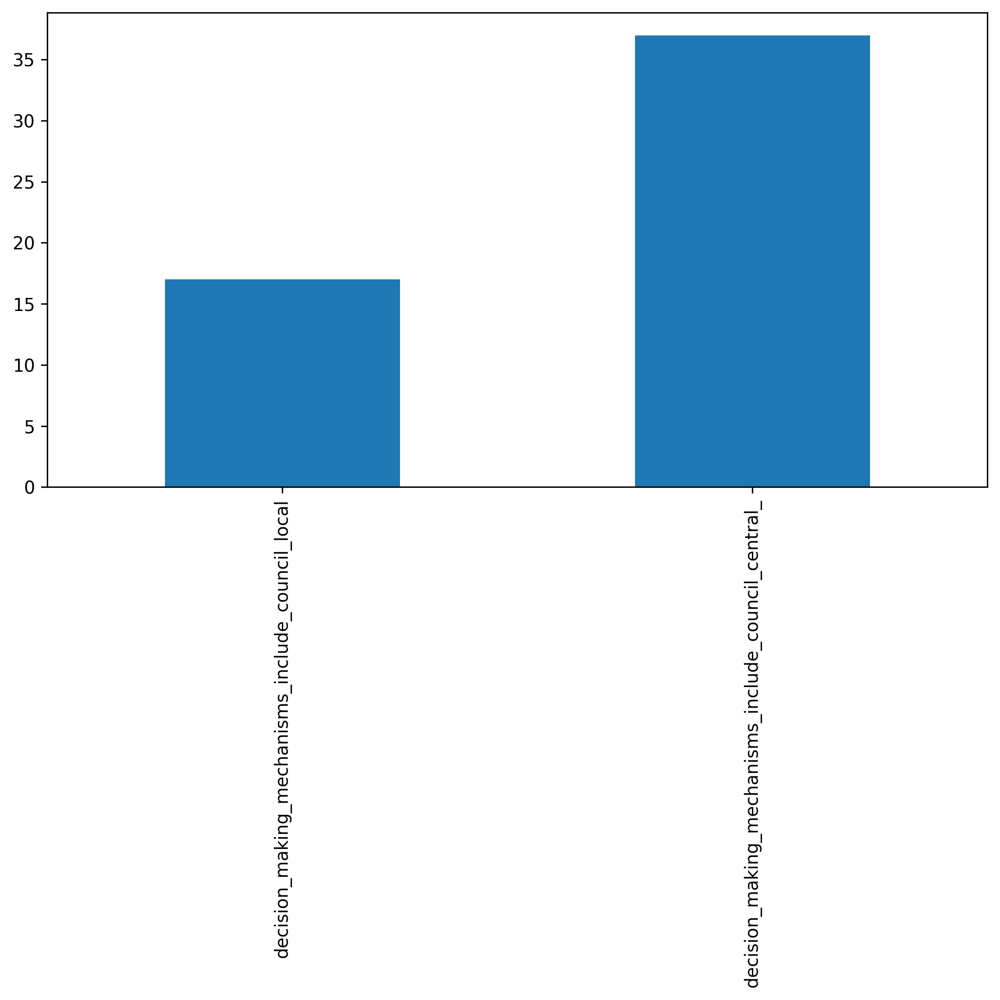

In [29]:
plt.figure(figsize=(8,8))
council_df[council_cols].sum().plot(kind='bar')

plt.tight_layout()
plt.savefig('../v2-fig/fig-councils/histogram.png')
plt.show()

In [30]:
council_df[['Name'] + council_cols]

,Name,decision_making_mechanisms_include_council_local,decision_making_mechanisms_include_council_central_
1,Aedui (Celtic Oppida),0,1
2,Akha,0,1
3,Amalfi,0,1
6,Athens (Classical Period),0,1
7,Aztec City-States,0,1
8,Babylonia,0,1
9,Carthage,0,1
10,Central African communities,1,0
12,Circassians,0,1
13,Cologne,0,1


## Correlations

In [31]:
data_plot = gov_df.select_dtypes(include=[np.number]).dropna()

In [32]:
data_plot.describe()

,Time span: Start,Time span: End,enforcement_mechanisms_include_seizing_of_property,decision_making_mechanisms_include_public_meetings,decision_making_mechanisms_include_power_fluidity,decision_making_mechanisms_include_petition,decision_making_mechanisms_include_veto,decision_making_mechanisms_include_representation,decision_making_mechanisms_include_rule_of_law,enforcement_mechanisms_include_appeal,enforcement_mechanisms_include_tribunal_court_,decision_making_mechanisms_include_kingchief-as-figurehead,enforcement_mechanisms_include_destruction_of_property,decision_making_mechanisms_include_remunerated_position,decision_making_mechanisms_include_voting,enforcement_mechanisms_include_mediation,access_mechanisms_include_matrilineality,decision_making_mechanisms_include_ratification_acclamation_only,decision_making_mechanisms_include_checks_and_balances,enforcement_mechanisms_include_judicial_review,access_mechanisms_include_patronage_for_office,decision_making_mechanisms_include_plurality_voting,access_mechanisms_include_age_boundaries,enforcement_mechanisms_include_monitoring,decision_making_mechanisms_include_dual-sex_political_system,decision_making_mechanisms_include_word_of_mouth,decision_making_mechanisms_include_assembly_central,enforcement_mechanisms_include_graduated_sanctions,access_mechanisms_include_blood_relations,decision_making_mechanisms_include_agenda_setting,enforcement_mechanisms_include_suspension_expulsion_ostracism_proscription,decision_making_mechanisms_include_group_voting,decision_making_mechanisms_include_consent,decision_making_mechanisms_include_autocratic_leader_unbound,access_mechanisms_include_life_appointment,access_mechanisms_include_heredity,decision_making_mechanisms_include_coalition,decision_making_mechanisms_include_assembly_elite,decision_making_mechanisms_include_delegation,decision_making_mechanisms_include_quorum,access_mechanisms_include_popularity_,decision_making_mechanisms_include_leader_first_among_equals,decision_making_mechanisms_include_balance_of_power,access_mechanisms_include_divine_right,decision_making_mechanisms_include_vote_by_proxy,access_mechanisms_include_co-optation,decision_making_mechanisms_include_constitution,enforcement_mechanisms_include_capital_punishment,decision_making_mechanisms_include_autocratic_leader_chief_bound,enforcement_mechanisms_include_jury_judge,decision_making_mechanisms_include_turnover_rotation,access_mechanisms_include_female_participation,decision_making_mechanisms_include_consultation,enforcement_mechanisms_include_self-help,decision_making_mechanisms_include_oath,decision_making_mechanisms_include_supermajority,decision_making_mechanisms_include_council_central_,decision_making_mechanisms_include_lobbying,enforcement_mechanisms_include_police,decision_making_mechanisms_include_alliance,access_mechanisms_include_election,enforcement_mechanisms_include_reputational_risk,enforcement_mechanisms_include_paying_damages_compensation,access_mechanisms_include_screening_process,access_mechanisms_include_gerontocracy,access_mechanisms_include_payment_for_occupying_office,decision_making_mechanisms_include_board_committee,access_mechanisms_include_property_requirement,enforcement_mechanisms_include_negotiation,decision_making_mechanisms_include_secret_ballot,decision_making_mechanisms_include_gathering,enforcement_mechanisms_include_criticism_mocking_joking,decision_making_mechanisms_include_unanimity,decision_making_mechanisms_include_frequent_and_or_regular_meetings,decision_making_mechanisms_include_majority_voting,decision_making_mechanisms_include_consensus,decision_making_mechanisms_include_vote_by_show_of_hands,decision_making_mechanisms_include_bureaucracy,access_mechanisms_include_enfranchisement,enforcement_mechanisms_include_civil_disobedience,decision_making_mechanisms_include_assembly_local,access_mechanisms_include_open_political_unit,decision_making_mechanisms_include_deliberation,decision_making_mechanisms_include_temporary_position_

In [33]:
normalized = Normalizer().fit_transform(data_plot)

norm_df = pd.DataFrame(normalized)
norm_df.columns = data_plot.columns
norm_corr = norm_df.corr()

norm_corr.head()

,Time span: Start,Time span: End,enforcement_mechanisms_include_seizing_of_property,decision_making_mechanisms_include_public_meetings,decision_making_mechanisms_include_power_fluidity,decision_making_mechanisms_include_petition,decision_making_mechanisms_include_veto,decision_making_mechanisms_include_representation,decision_making_mechanisms_include_rule_of_law,enforcement_mechanisms_include_appeal,enforcement_mechanisms_include_tribunal_court_,decision_making_mechanisms_include_kingchief-as-figurehead,enforcement_mechanisms_include_destruction_of_property,decision_making_mechanisms_include_remunerated_position,decision_making_mechanisms_include_voting,enforcement_mechanisms_include_mediation,access_mechanisms_include_matrilineality,decision_making_mechanisms_include_ratification_acclamation_only,decision_making_mechanisms_include_checks_and_balances,enforcement_mechanisms_include_judicial_review,access_mechanisms_include_patronage_for_office,decision_making_mechanisms_include_plurality_voting,access_mechanisms_include_age_boundaries,enforcement_mechanisms_include_monitoring,decision_making_mechanisms_include_dual-sex_political_system,decision_making_mechanisms_include_word_of_mouth,decision_making_mechanisms_include_assembly_central,enforcement_mechanisms_include_graduated_sanctions,access_mechanisms_include_blood_relations,decision_making_mechanisms_include_agenda_setting,enforcement_mechanisms_include_suspension_expulsion_ostracism_proscription,decision_making_mechanisms_include_group_voting,decision_making_mechanisms_include_consent,decision_making_mechanisms_include_autocratic_leader_unbound,access_mechanisms_include_life_appointment,access_mechanisms_include_heredity,decision_making_mechanisms_include_coalition,decision_making_mechanisms_include_assembly_elite,decision_making_mechanisms_include_delegation,decision_making_mechanisms_include_quorum,access_mechanisms_include_popularity_,decision_making_mechanisms_include_leader_first_among_equals,decision_making_mechanisms_include_balance_of_power,access_mechanisms_include_divine_right,decision_making_mechanisms_include_vote_by_proxy,access_mechanisms_include_co-optation,decision_making_mechanisms_include_constitution,enforcement_mechanisms_include_capital_punishment,decision_making_mechanisms_include_autocratic_leader_chief_bound,enforcement_mechanisms_include_jury_judge,decision_making_mechanisms_include_turnover_rotation,access_mechanisms_include_female_participation,decision_making_mechanisms_include_consultation,enforcement_mechanisms_include_self-help,decision_making_mechanisms_include_oath,decision_making_mechanisms_include_supermajority,decision_making_mechanisms_include_council_central_,decision_making_mechanisms_include_lobbying,enforcement_mechanisms_include_police,decision_making_mechanisms_include_alliance,access_mechanisms_include_election,enforcement_mechanisms_include_reputational_risk,enforcement_mechanisms_include_paying_damages_compensation,access_mechanisms_include_screening_process,access_mechanisms_include_gerontocracy,access_mechanisms_include_payment_for_occupying_office,decision_making_mechanisms_include_board_committee,access_mechanisms_include_property_requirement,enforcement_mechanisms_include_negotiation,decision_making_mechanisms_include_secret_ballot,decision_making_mechanisms_include_gathering,enforcement_mechanisms_include_criticism_mocking_joking,decision_making_mechanisms_include_unanimity,decision_making_mechanisms_include_frequent_and_or_regular_meetings,decision_making_mechanisms_include_majority_voting,decision_making_mechanisms_include_consensus,decision_making_mechanisms_include_vote_by_show_of_hands,decision_making_mechanisms_include_bureaucracy,access_mechanisms_include_enfranchisement,enforcement_mechanisms_include_civil_disobedience,decision_making_mechanisms_include_assembly_local,access_mechanisms_include_open_political_unit,decision_making_mechanisms_include_deliberation,decision_making_mechanisms_include_temporary_position_

In [34]:
councils_corr = norm_corr[council_cols]

In [35]:
councils_corr

,decision_making_mechanisms_include_council_local,decision_making_mechanisms_include_council_central_
Time span: Start,0.269797,-0.459154
Time span: End,0.220553,-0.333680
enforcement_mechanisms_include_seizing_of_property,-0.012260,0.237382
decision_making_mechanisms_include_public_meetings,-0.130305,0.211933
decision_making_mechanisms_include_power_fluidity,-0.070459,-0.085689
decision_making_mechanisms_include_petition,0.128721,-0.085689
decision_making_mechanisms_include_veto,-0.049219,0.320155
decision_making_mechanisms_include_representation,0.448581,-0.183724
decision_making_mechanisms_include_rule_of_law,-0.092467,0.246047
enforcement_mechanisms_include_appeal,-0.042733,-0.101481


TODO:
- Councils:
    - Sort and visualize correlations, local
    - Sort and visualize correlations, central
    - Histograms: region, size, time
    - Graph timeline
    - Graph region
- Courts
    - Sort and visualize correlations
    - Histograms: region, size, time
    - Graph timeline
    - Graph region

## Councils Analysis: Local and Central x Mechanisms

In [36]:
plt.figure(figsize=(25,25))
sns.heatmap(
    councils_corr.sort_values(by='decision_making_mechanisms_include_council_local', ascending=False), 
    annot=True,
    cmap='BrBG',
    vmin=-1,
    vmax=1
)

plt.tight_layout()
plt.savefig('../v2-fig/fig-councils/councils_local_corr.png')
plt.show()

In [37]:
plt.figure(figsize=(25,25))
sns.heatmap(
    councils_corr.sort_values(by='decision_making_mechanisms_include_council_central_', ascending=False), 
    annot=True,
    cmap='BrBG',
    vmin=-1,
    vmax=1
)

plt.tight_layout()
plt.savefig('../v2-fig/fig-councils/councils_central_corr.png')
plt.show()

### Access

In [38]:
access_councils_corr = councils_corr[councils_corr.index.str.startswith('access')]

In [39]:
access_councils_corr

,decision_making_mechanisms_include_council_local,decision_making_mechanisms_include_council_central_
access_mechanisms_include_matrilineality,0.425331,-0.112832
access_mechanisms_include_patronage_for_office,0.142244,-0.091203
access_mechanisms_include_age_boundaries,-0.092512,0.292262
access_mechanisms_include_blood_relations,-0.068090,0.275979
access_mechanisms_include_life_appointment,0.096726,-0.122089
access_mechanisms_include_heredity,0.162310,-0.022078
access_mechanisms_include_popularity_,0.213423,-0.045289
access_mechanisms_include_divine_right,-0.028726,-0.043243
access_mechanisms_include_co-optation,0.021492,-0.018709
access_mechanisms_include_female_participation,0.085920,-0.123113


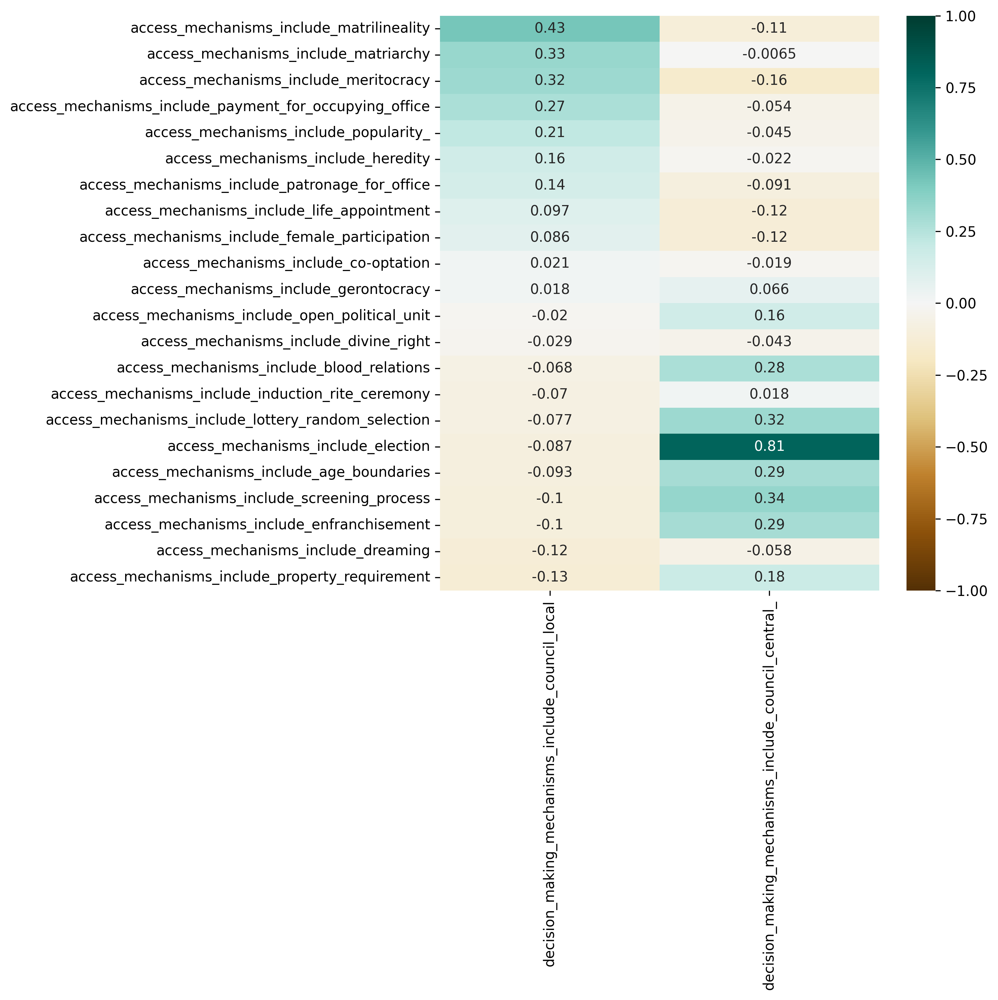

In [40]:
plt.figure(figsize=(10,10))
sns.heatmap(
    access_councils_corr.sort_values(by='decision_making_mechanisms_include_council_local', ascending=False), 
    annot=True,
    cmap='BrBG',
    vmin=-1,
    vmax=1
)

plt.tight_layout()
plt.savefig('../v2-fig/fig-councils/access_councils_local_corr.png')
plt.show()

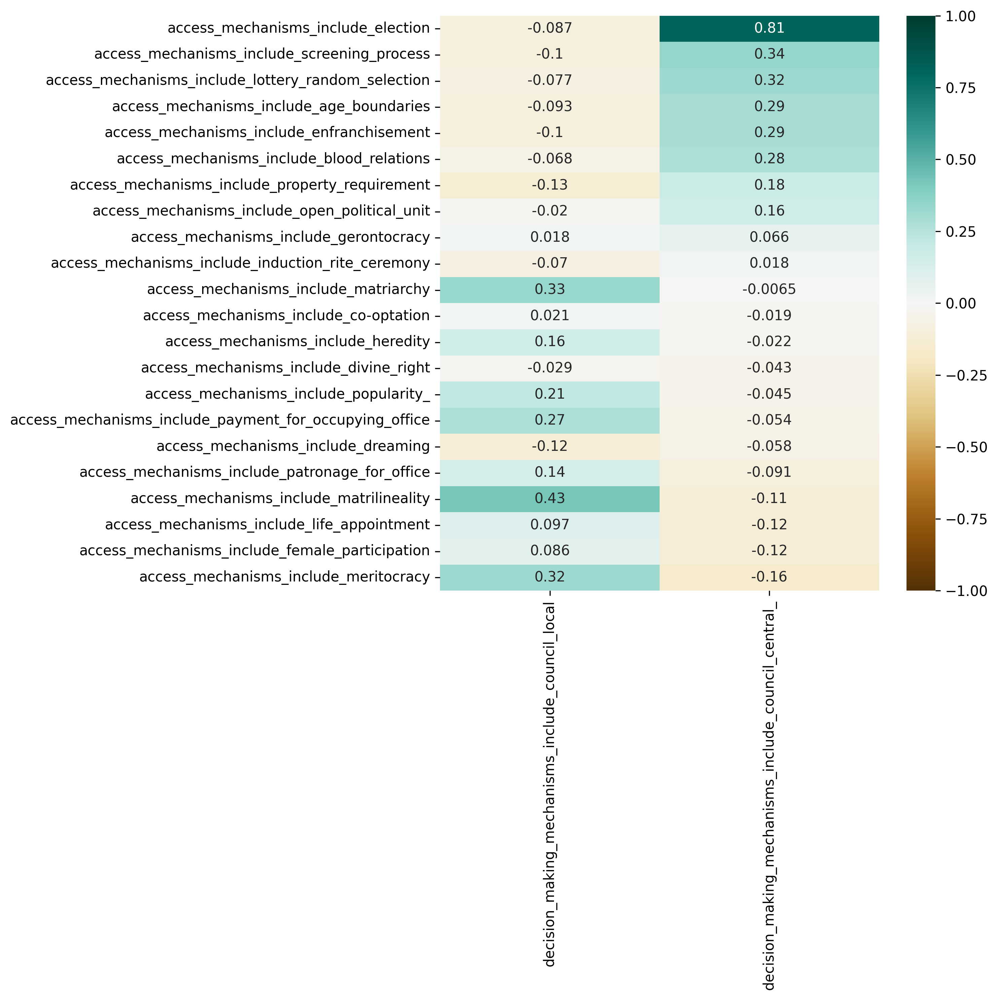

In [41]:
plt.figure(figsize=(10,10))
sns.heatmap(
    access_councils_corr.sort_values(by='decision_making_mechanisms_include_council_central_', ascending=False), 
    annot=True,
    cmap='BrBG',
    vmin=-1,
    vmax=1
)

plt.tight_layout()
plt.savefig('../v2-fig/fig-councils/access_councils_central_corr.png')
plt.show()

### Decision Making

In [42]:
dm_councils_corr = councils_corr[councils_corr.index.str.startswith('decision_making')]

In [43]:
dm_councils_corr

,decision_making_mechanisms_include_council_local,decision_making_mechanisms_include_council_central_
decision_making_mechanisms_include_public_meetings,-0.130305,0.211933
decision_making_mechanisms_include_power_fluidity,-0.070459,-0.085689
decision_making_mechanisms_include_petition,0.128721,-0.085689
decision_making_mechanisms_include_veto,-0.049219,0.320155
decision_making_mechanisms_include_representation,0.448581,-0.183724
decision_making_mechanisms_include_rule_of_law,-0.092467,0.246047
decision_making_mechanisms_include_kingchief-as-figurehead,0.131216,-0.138813
decision_making_mechanisms_include_remunerated_position,-0.197391,0.279521
decision_making_mechanisms_include_voting,-0.069529,0.263152
decision_making_mechanisms_include_ratification_acclamation_only,-0.028361,0.658476


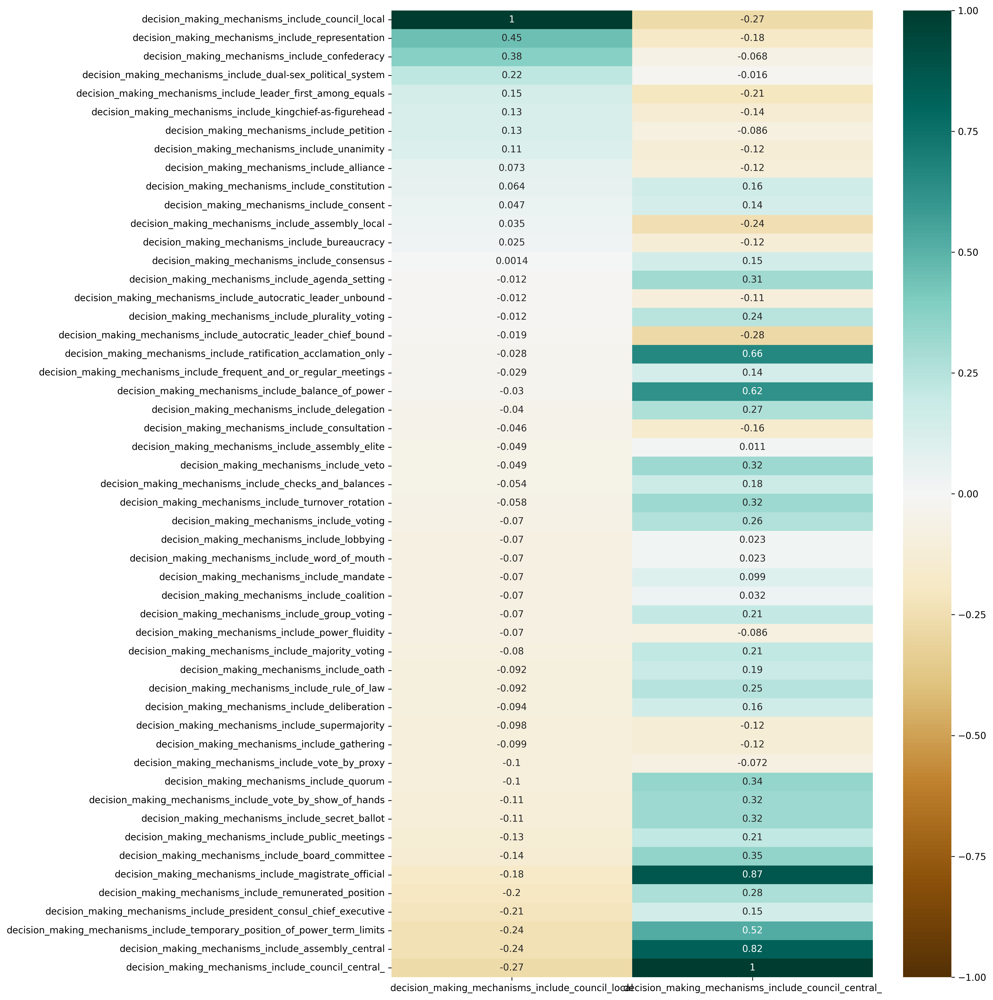

In [44]:
plt.figure(figsize=(15,15))
sns.heatmap(
    dm_councils_corr.sort_values(by='decision_making_mechanisms_include_council_local', ascending=False), 
    annot=True,
    cmap='BrBG',
    vmin=-1,
    vmax=1
)

plt.tight_layout()
plt.savefig('../v2-fig/fig-councils/dm_councils_local_corr.png')
plt.show()

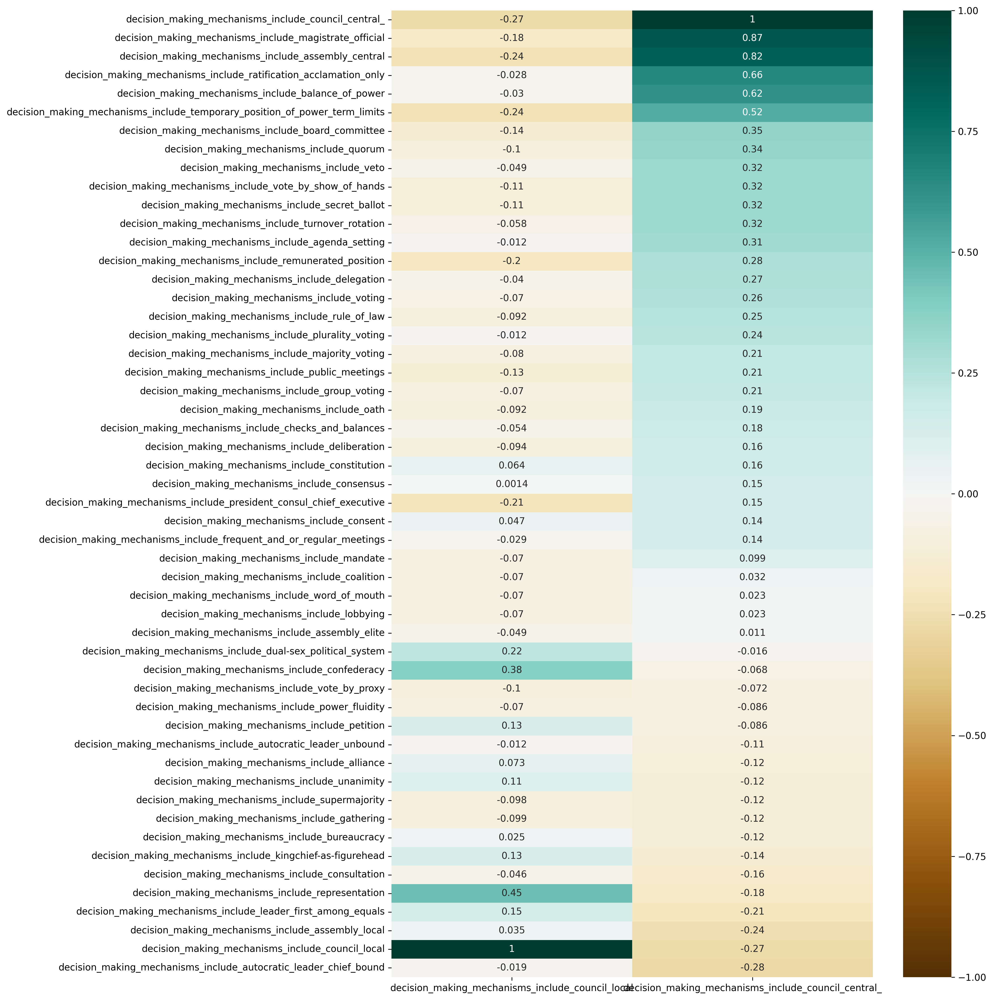

In [45]:
plt.figure(figsize=(15,15))
sns.heatmap(
    dm_councils_corr.sort_values(by='decision_making_mechanisms_include_council_central_', ascending=False), 
    annot=True,
    cmap='BrBG',
    vmin=-1,
    vmax=1
)

plt.tight_layout()
plt.savefig('../v2-fig/fig-councils/dm_councils_central_corr.png')
plt.show()

### Enforcement

In [46]:
enforcement_councils_corr = councils_corr[councils_corr.index.str.startswith('enforcement')]

In [47]:
enforcement_councils_corr

,decision_making_mechanisms_include_council_local,decision_making_mechanisms_include_council_central_
enforcement_mechanisms_include_seizing_of_property,-0.012260,0.237382
enforcement_mechanisms_include_appeal,-0.042733,-0.101481
enforcement_mechanisms_include_tribunal_court_,-0.167552,0.312114
enforcement_mechanisms_include_destruction_of_property,0.063284,-0.061820
enforcement_mechanisms_include_mediation,-0.118449,-0.144053
enforcement_mechanisms_include_judicial_review,-0.005350,0.237870
enforcement_mechanisms_include_monitoring,-0.090460,0.241745
enforcement_mechanisms_include_graduated_sanctions,-0.070459,-0.004508
enforcement_mechanisms_include_suspension_expulsion_ostracism_proscription,-0.053874,0.430184
enforcement_mechanisms_include_capital_punishment,-0.062823,0.208066


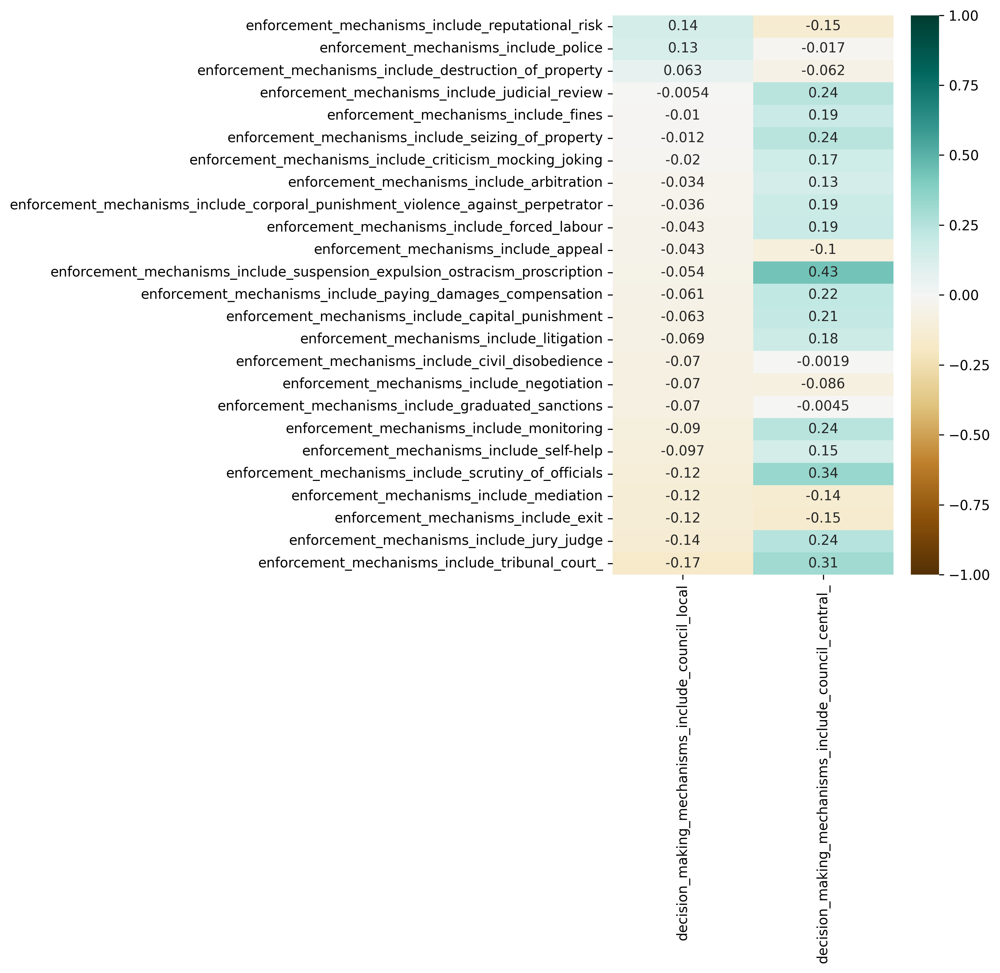

In [48]:
plt.figure(figsize=(10,10))
sns.heatmap(
    enforcement_councils_corr.sort_values(by='decision_making_mechanisms_include_council_local', ascending=False), 
    annot=True,
    cmap='BrBG',
    vmin=-1,
    vmax=1
)

plt.tight_layout()
plt.savefig('../v2-fig/fig-councils/enforcement_councils_local_corr.png')
plt.show()

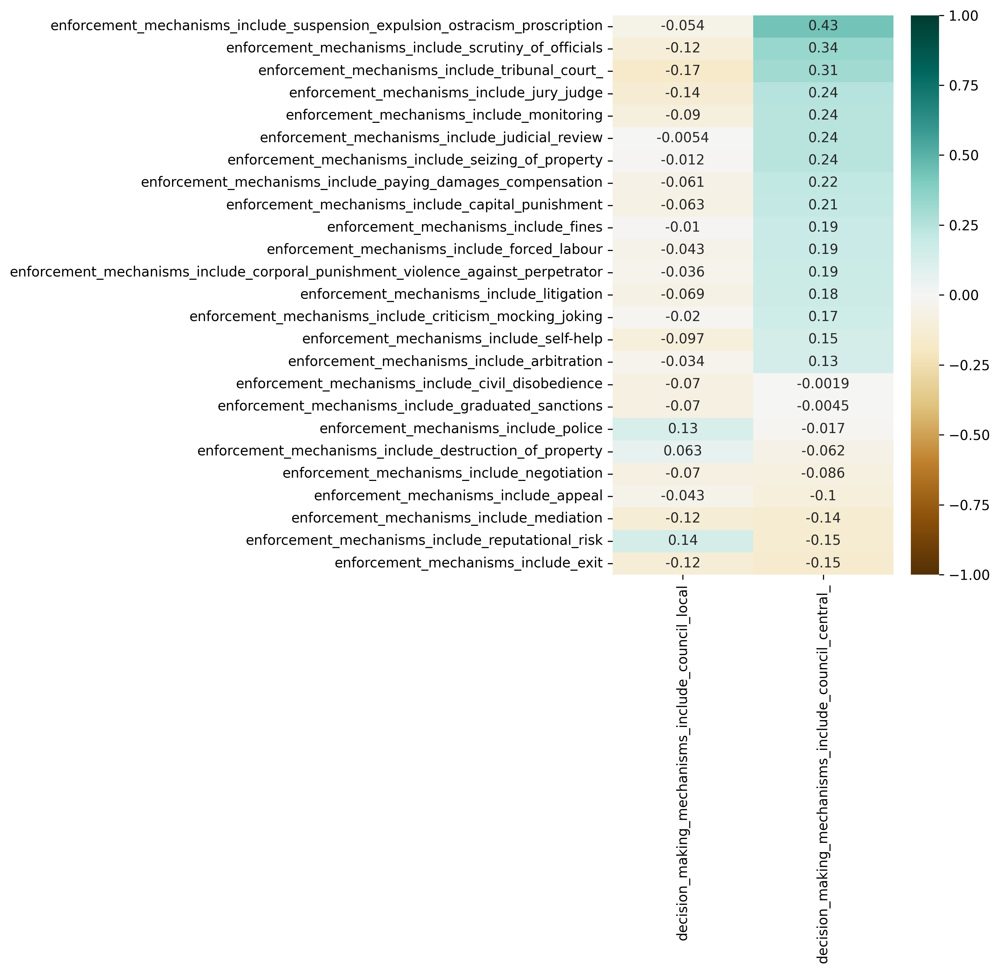

In [49]:
plt.figure(figsize=(10,10))
sns.heatmap(
    enforcement_councils_corr.sort_values(by='decision_making_mechanisms_include_council_central_', ascending=False), 
    annot=True,
    cmap='BrBG',
    vmin=-1,
    vmax=1
)

plt.tight_layout()
plt.savefig('../v2-fig/fig-councils/enforcement_councils_central_corr.png')
plt.show()

## Councils Analysis: Size

In [50]:
size_cols = [col for col in col_list if col.startswith('Size:')]
size_cols

['Size: 100 - 1,000',
 'Size: 1,001 - 10,000',
 'Size: 10,001 - 100,000',
 'Size: 100,001 - 1,000,000',
 'Size: 1,000,001 - 10,000,000',
 'Size: 10,000,000+',
 'Size: Unknown']

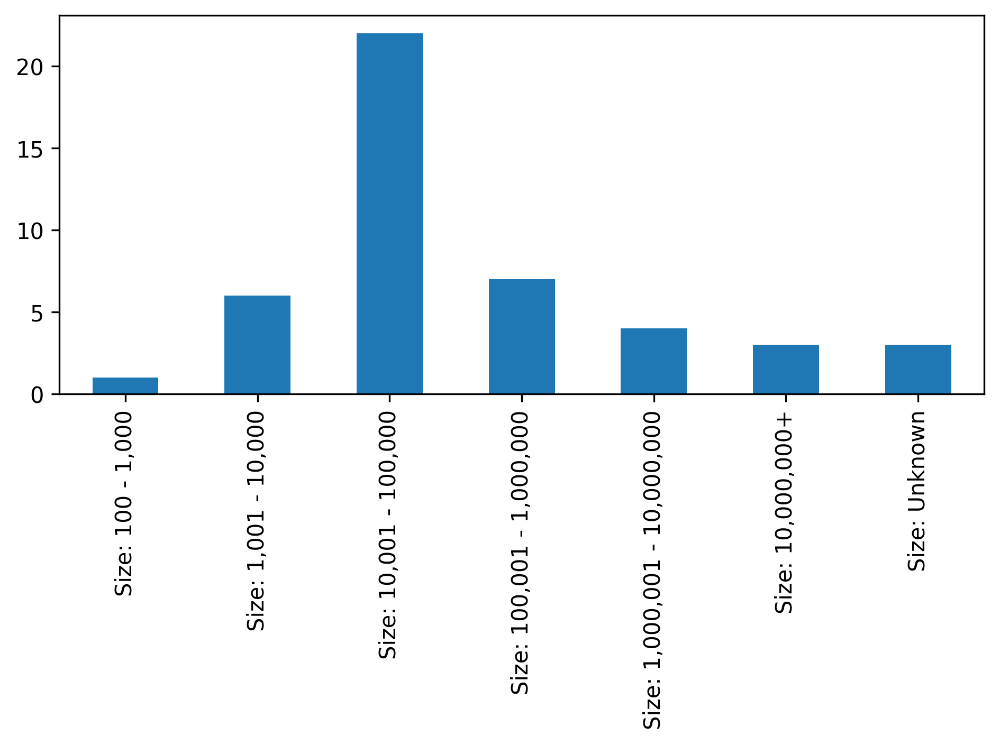

In [51]:
# Size histogram
council_df[size_cols].sum().plot(kind='bar')

plt.tight_layout()
plt.savefig('../v2-fig/fig-councils/all_councils_size_histogram.png')
plt.show()

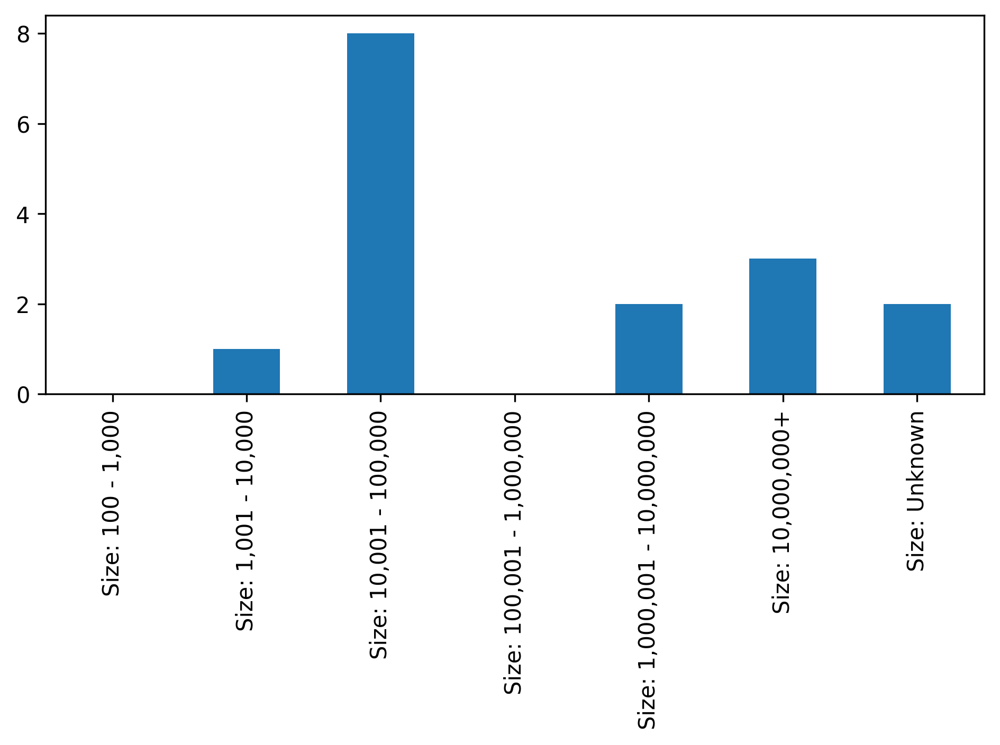

In [52]:
# Size histogram
local_councils_df[size_cols].sum().plot(kind='bar')

plt.tight_layout()
plt.savefig('../v2-fig/fig-councils/local_councils_size_histogram.png')

plt.show()

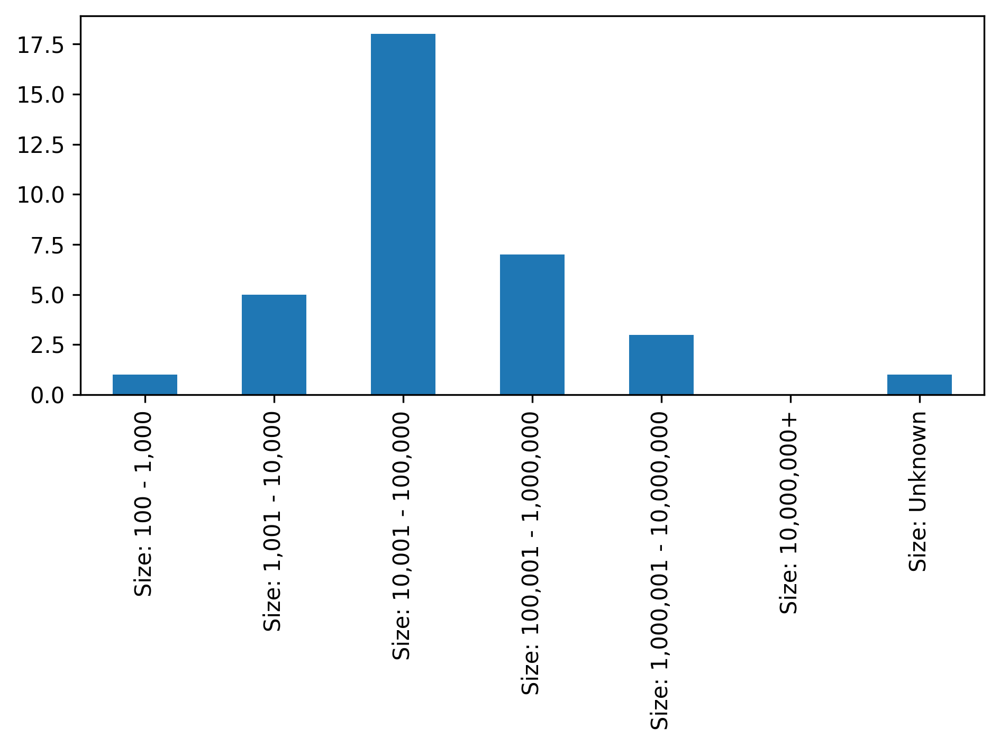

In [53]:
# Size histogram
central_councils_df[size_cols].sum().plot(kind='bar')

plt.tight_layout()
plt.savefig('../v2-fig/fig-councils/central_councils_size_histogram.png')
plt.show()

In [54]:
size_councils_corr = councils_corr[councils_corr.index.str.startswith('Size:')]

In [55]:
size_councils_corr

,decision_making_mechanisms_include_council_local,decision_making_mechanisms_include_council_central_
"Size: 100 - 1,000",-0.070459,-0.004508
"Size: 1,001 - 10,000",-0.155500,0.040198
"Size: 10,001 - 100,000",-0.029012,0.189237
"Size: 100,001 - 1,000,000",-0.153274,0.761957
"Size: 1,000,001 - 10,000,000",-0.062033,0.105130
"Size: 10,000,000+",0.216957,-0.160051
Size: Unknown,-0.002895,-0.108274


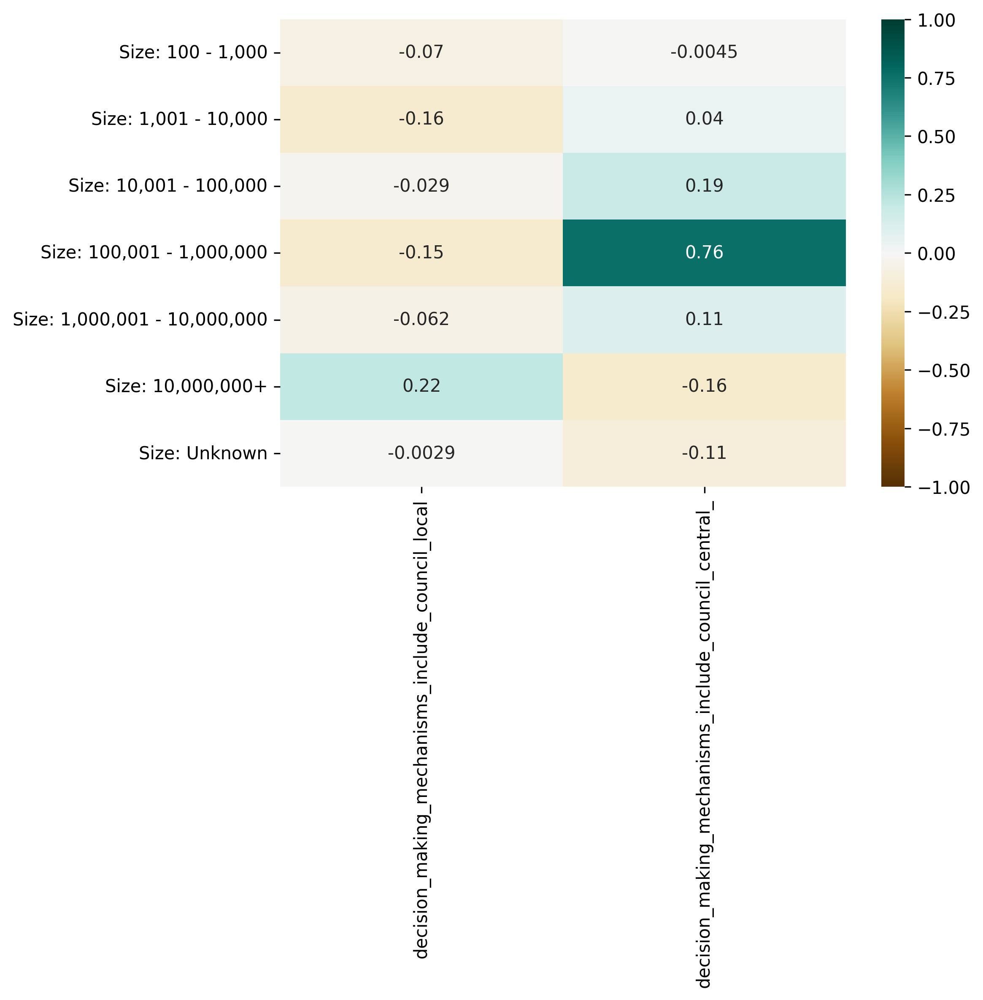

In [56]:
plt.figure(figsize=(8,8))
sns.heatmap(
    size_councils_corr, 
    annot=True,
    cmap='BrBG',
    vmin=-1,
    vmax=1
)

plt.tight_layout()
plt.savefig('../v2-fig/fig-councils/councils_size_corr.png')
plt.show()

## Councils Analysis: Region

In [57]:
region_cols = [col for col in col_list if col.startswith('Region:')]
region_cols

['Region: Africa',
 'Region: Europe',
 'Region: Asia',
 'Region: Middle East',
 'Region: North America',
 'Region: Central America',
 'Region: South America',
 'Region: Oceania']

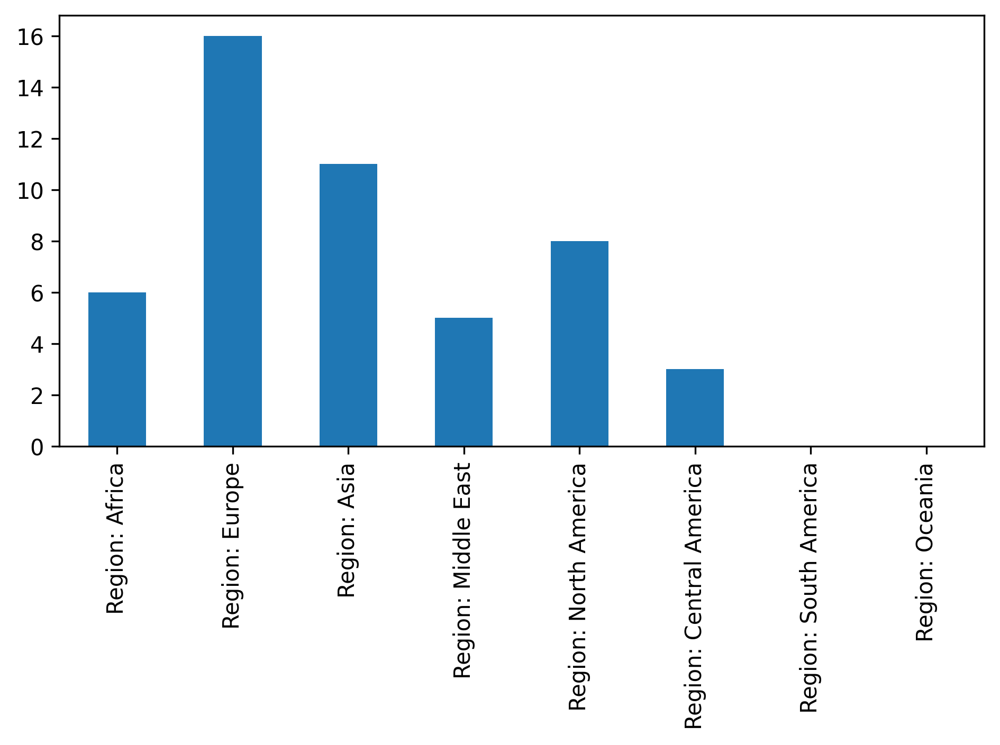

In [58]:
# Region histogram
council_df[region_cols].sum().plot(kind='bar')

plt.tight_layout()
plt.savefig('../v2-fig/fig-councils/all_councils_region_histogram.png')
plt.show()

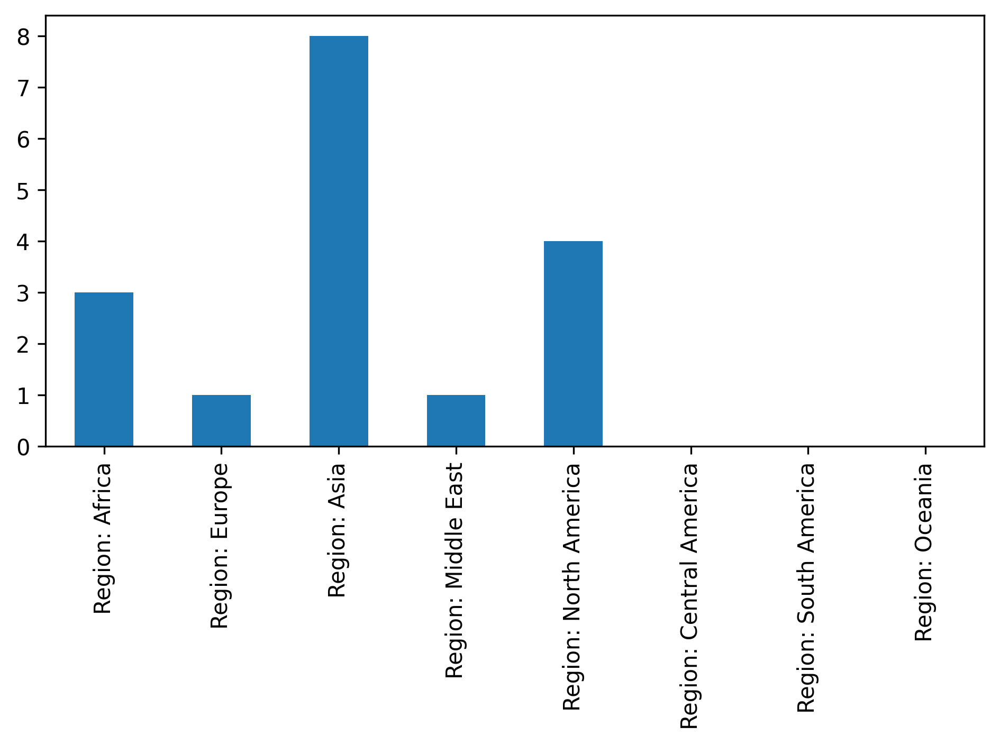

In [59]:
# Region histogram
local_councils_df[region_cols].sum().plot(kind='bar')

plt.tight_layout()
plt.savefig('../v2-fig/fig-councils/local_councils_region_histogram.png')
plt.show()

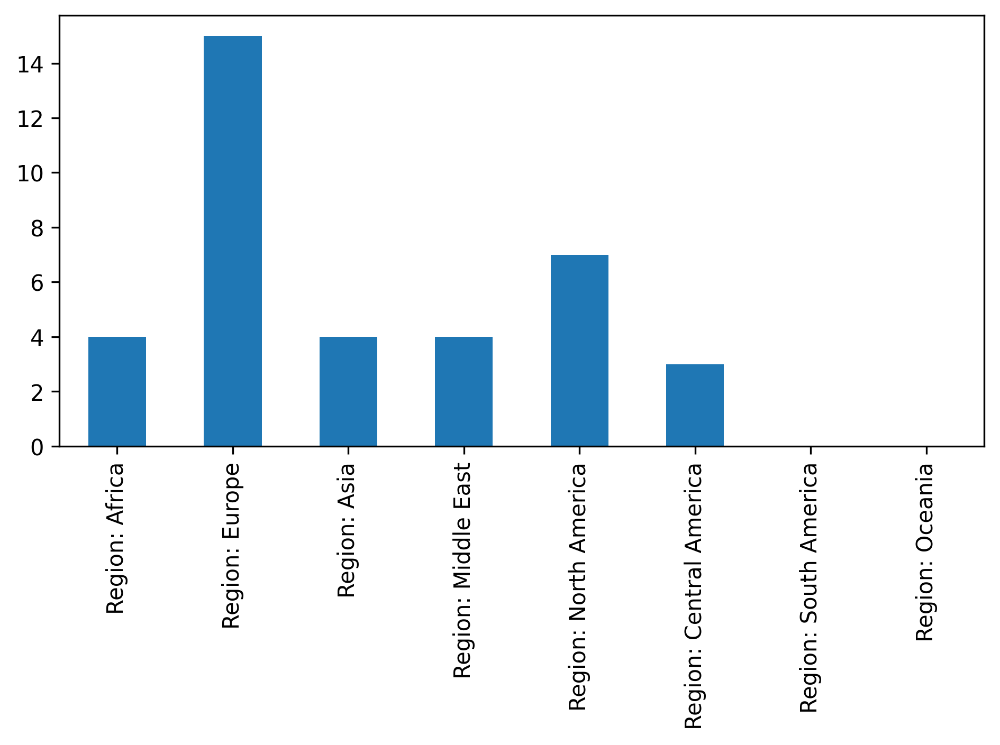

In [60]:
# Region histogram
central_councils_df[region_cols].sum().plot(kind='bar')

plt.tight_layout()
plt.savefig('../v2-fig/fig-councils/central_councils_region_histogram.png')
plt.show()

In [61]:
region_councils_corr = councils_corr[councils_corr.index.str.startswith('Region:')]

In [62]:
region_councils_corr

,decision_making_mechanisms_include_council_local,decision_making_mechanisms_include_council_central_
Region: Africa,0.001188,0.213722
Region: Europe,-0.266938,0.788143
Region: Asia,0.241022,-0.246730
Region: Middle East,-0.092730,-0.020670
Region: North America,0.238893,-0.027757
Region: Central America,-0.142777,0.000203
Region: South America,-0.070459,-0.085689
Region: Oceania,-0.070459,-0.085689


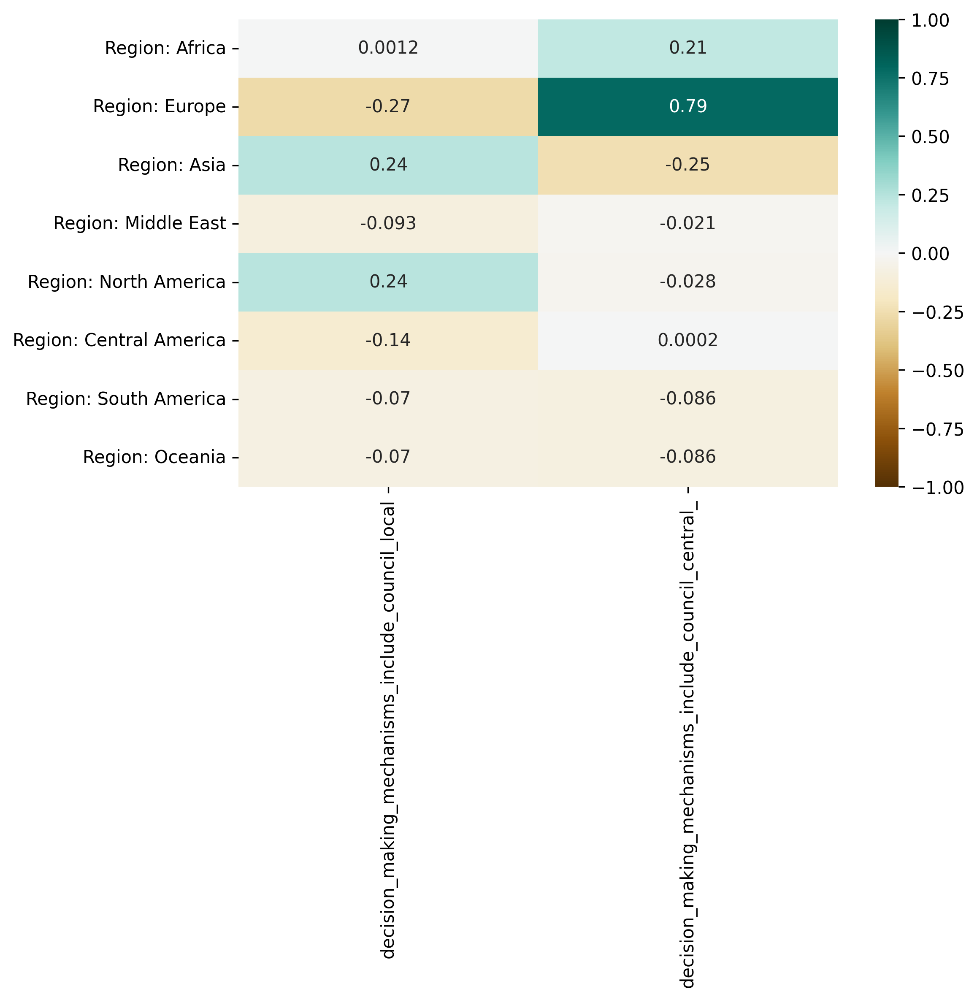

In [63]:
plt.figure(figsize=(8,8))
sns.heatmap(
    region_councils_corr, 
    annot=True,
    cmap='BrBG',
    vmin=-1,
    vmax=1
)

plt.tight_layout()
plt.savefig('../v2-fig/fig-councils/councils_region_corr.png')
plt.show()

### Mapping council regions

In [64]:
worldmap = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))

worldmap.head()

/var/folders/v7/8x_7ty4j3m76hgg7tncks_kc0000gn/T/ipykernel_47881/1532259957.py:1: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  worldmap = gpd.read_file(gpd.datasets.get_path("naturalearth_lowres"))


,pop_est,continent,name,iso_a3,gdp_md_est,geometry
0,889953.0,Oceania,Fiji,FJI,5496,"MULTIPOLYGON (((180.00000 -16.06713, 180.00000..."
1,58005463.0,Africa,Tanzania,TZA,63177,"POLYGON ((33.90371 -0.95000, 34.07262 -1.05982..."
2,603253.0,Africa,W. Sahara,ESH,907,"POLYGON ((-8.66559 27.65643, -8.66512 27.58948..."
3,37589262.0,North America,Canada,CAN,1736425,"MULTIPOLYGON (((-122.84000 49.00000, -122.9742..."
4,328239523.0,North America,United States of America,USA,21433226,"MULTIPOLYGON (((-122.84000 49.00000, -120.0000..."


In [65]:
central_america_countries = [
    'Belize',
    'Costa Rica',
    'El Salvador',
    'Guatemala',
    'Honduras',
    'Nicaragua',
    'Panama'
]

middle_east_countries = [
    'Cyprus',
    'Egypt',
    'Iran',
    'Iraq',
    'Israel',
    'Jordan',
    'Kuwait',
    'Lebanon',
    'Oman',
    'Palestine',
    'Qatar',
    'Saudi Arabia',
    'Syria',
    'Turkey',
    'United Arab Emirates',
    'Yemen'
]

# Add region for Central America
worldmap.loc[(worldmap['name'].isin(central_america_countries)), 'continent'] = 'Central America'

# Add region for Middle East
worldmap.loc[(worldmap['name'].isin(middle_east_countries)), 'continent'] = 'Middle East'

worldmap['continent'].value_counts()

continent
Africa                     50
Europe                     39
Asia                       32
Middle East                16
South America              13
North America              11
Oceania                     7
Central America             7
Seven seas (open ocean)     1
Antarctica                  1
Name: count, dtype: int64

In [66]:
region_map = gpd.GeoDataFrame(columns=['Region', 'geometry'])
regions_list = list(gov_df['Region'].unique())

In [67]:
region_map['Region'] = regions_list

region_map['geometry'].loc[region_map['Region'] == 'Africa'] = worldmap.loc[(worldmap['continent'] == 'Africa')].unary_union
region_map['geometry'].loc[region_map['Region'] == 'Europe'] = worldmap.loc[(worldmap['continent'] == 'Europe')].unary_union
region_map['geometry'].loc[region_map['Region'] == 'Asia'] = worldmap.loc[(worldmap['continent'] == 'Asia')].unary_union
region_map['geometry'].loc[region_map['Region'] == 'Middle East'] = worldmap.loc[(worldmap['continent'] == 'Middle East')].unary_union
region_map['geometry'].loc[region_map['Region'] == 'North America'] = worldmap.loc[(worldmap['continent'] == 'North America')].unary_union
region_map['geometry'].loc[region_map['Region'] == 'Central America'] = worldmap.loc[(worldmap['continent'] == 'Central America')].unary_union
region_map['geometry'].loc[region_map['Region'] == 'South America'] = worldmap.loc[(worldmap['continent'] == 'South America')].unary_union
region_map['geometry'].loc[region_map['Region'] == 'Oceania'] = worldmap.loc[(worldmap['continent'] == 'Oceania')].unary_union

region_map

,Region,geometry
0,Africa,"MULTIPOLYGON (((-11.439 6.786, -11.708 6.860, ..."
1,Europe,"MULTIPOLYGON (((-53.555 2.335, -53.779 2.377, ..."
2,Asia,"MULTIPOLYGON (((105.857 -4.306, 105.818 -5.852..."
3,Middle East,"MULTIPOLYGON (((25.000 25.682, 25.000 29.239, ..."
4,Central America,"POLYGON ((-77.243 7.935, -77.431 7.638, -77.75..."
5,North America,"MULTIPOLYGON (((-155.222 19.240, -155.542 19.0..."
6,South America,"MULTIPOLYGON (((-68.640 -55.580, -69.232 -55.4..."
7,Oceania,"MULTIPOLYGON (((147.914 -43.212, 147.565 -42.9..."


#### All Councils

In [68]:
all_councils_region_map = region_map

In [69]:
councils_region_counts = council_df['Region'].value_counts().rename_axis('Region').reset_index(name='Count')

In [70]:
councils_region_counts

,Region,Count
0,Europe,16
1,Asia,11
2,North America,8
3,Africa,6
4,Middle East,5
5,Central America,3


In [72]:
all_merged_regions = pd.merge(all_councils_region_map, councils_region_counts, on='Region')

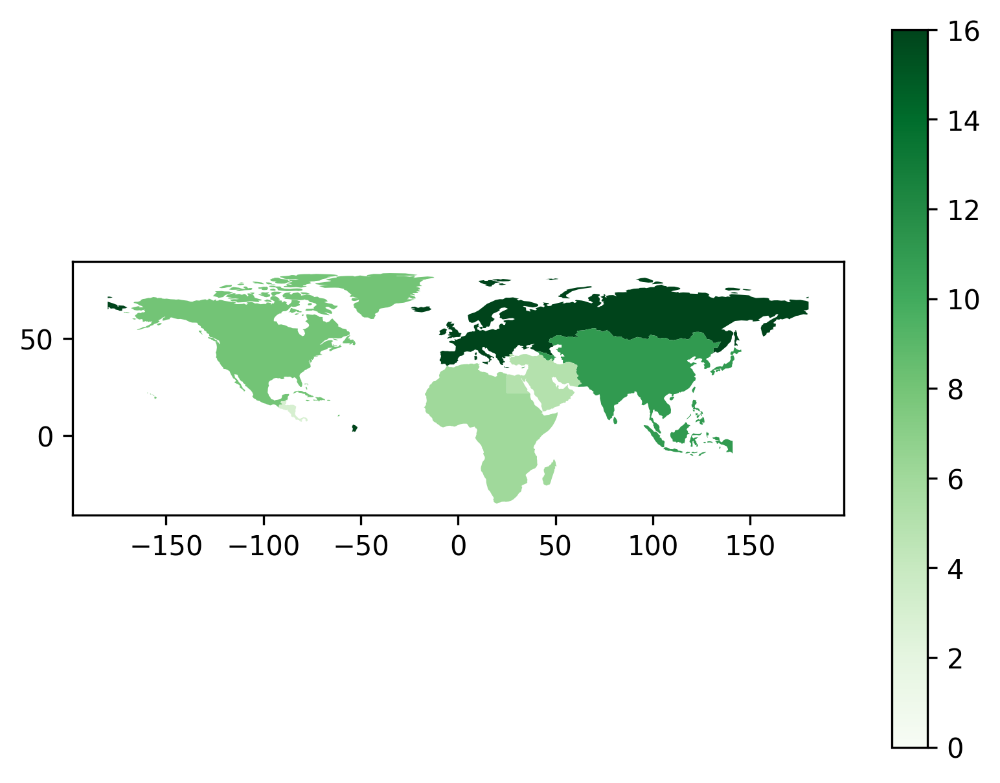

In [73]:
all_merged_regions.plot(
    column='Count', 
    legend=True,
    cmap='Greens',
    vmin=0,
    vmax=16
)

plt.savefig('../v2-fig/fig-councils/map_councils_all.png')
plt.show()

#### Local Councils

In [74]:
local_councils_region_map = region_map

In [75]:
local_councils_region_counts = local_councils_df['Region'].value_counts().rename_axis('Region').reset_index(name='Count')

In [76]:
local_councils_region_counts

,Region,Count
0,Asia,8
1,North America,4
2,Africa,3
3,Europe,1
4,Middle East,1


In [77]:
local_merged_regions = pd.merge(local_councils_region_map, local_councils_region_counts, on='Region')

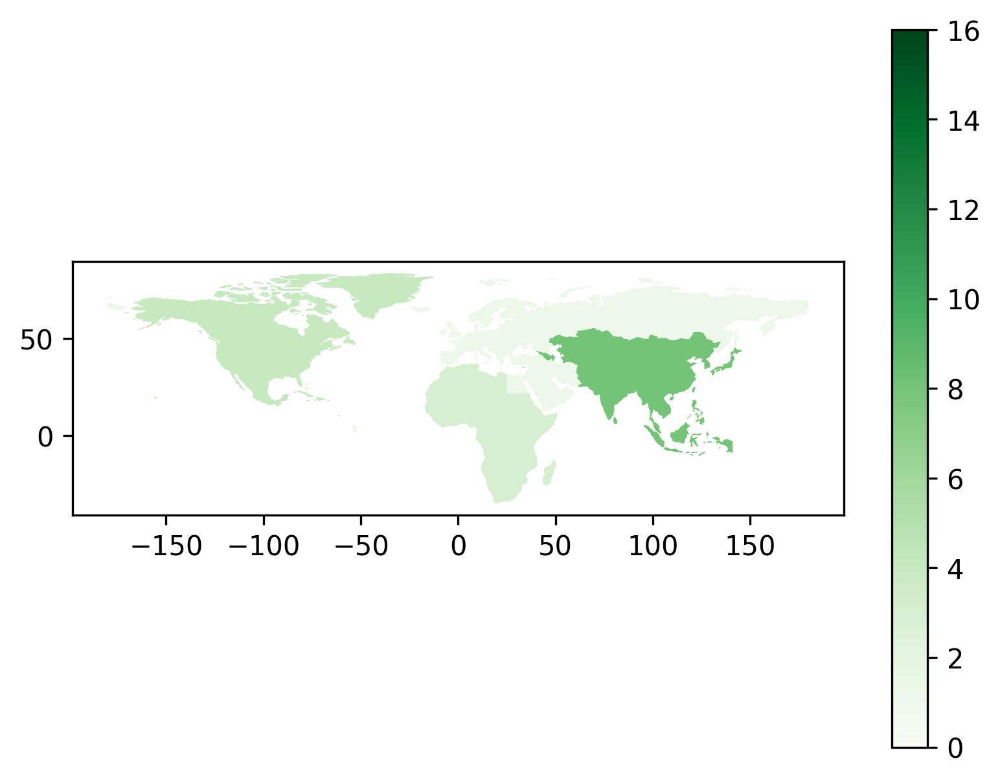

In [78]:
local_merged_regions.plot(
    column='Count', 
    legend=True,
    cmap='Greens',
    vmin=0,
    vmax=16
)

plt.savefig('../v2-fig/fig-councils/map_councils_local.png')
plt.show()

#### Central Councils

In [79]:
central_councils_region_map = region_map

In [80]:
central_councils_region_counts = central_councils_df['Region'].value_counts().rename_axis('Region').reset_index(name='Count')

In [81]:
central_councils_region_counts

,Region,Count
0,Europe,15
1,North America,7
2,Asia,4
3,Middle East,4
4,Africa,4
5,Central America,3


In [82]:
central_merged_regions = pd.merge(central_councils_region_map, central_councils_region_counts, on='Region')

In [83]:
central_merged_regions

,Region,geometry,Count
0,Africa,"MULTIPOLYGON (((-11.439 6.786, -11.708 6.860, ...",4
1,Europe,"MULTIPOLYGON (((-53.555 2.335, -53.779 2.377, ...",15
2,Asia,"MULTIPOLYGON (((105.857 -4.306, 105.818 -5.852...",4
3,Middle East,"MULTIPOLYGON (((25.000 25.682, 25.000 29.239, ...",4
4,Central America,"POLYGON ((-77.243 7.935, -77.431 7.638, -77.75...",3
5,North America,"MULTIPOLYGON (((-155.222 19.240, -155.542 19.0...",7


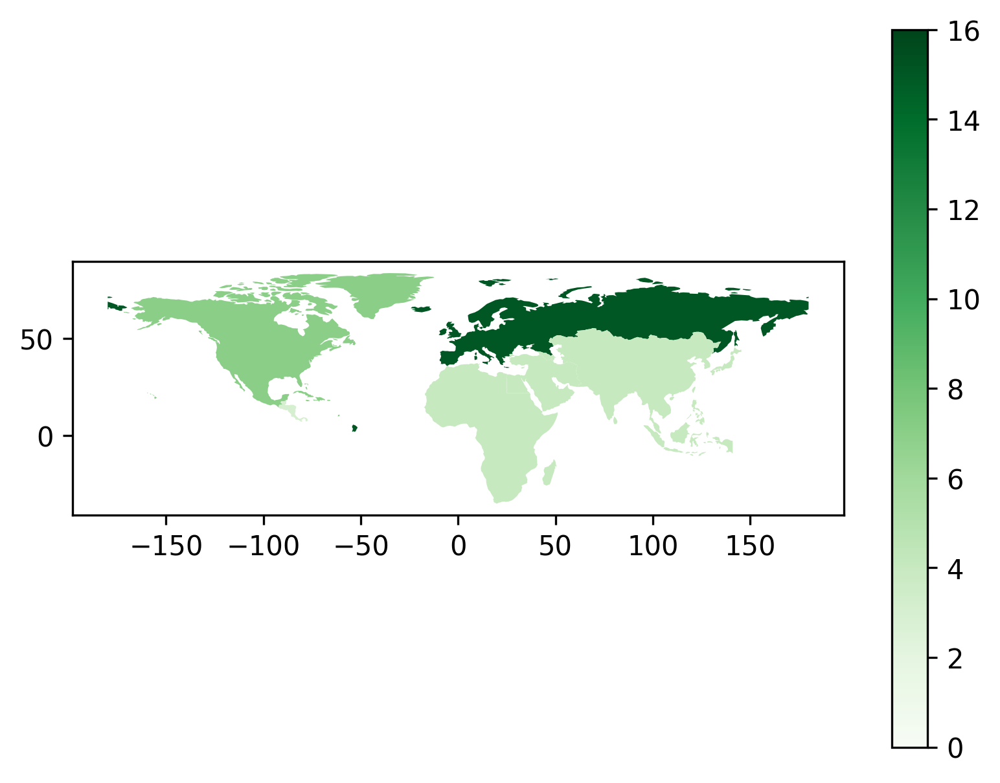

In [84]:
central_merged_regions.plot(
    column='Count', 
    legend=True,
    cmap='Greens',
    vmin=0,
    vmax=16
)

plt.savefig('../v2-fig/fig-councils/map_councils_central.png')
plt.show()

## Councils Analysis: Timeline 

In [85]:
council_dates_df = council_df[['Time span: Start', 'Time span: Duration', 'Name'] + council_cols]

In [86]:
council_dates_df

,Time span: Start,Time span: Duration,Name,decision_making_mechanisms_include_council_local,decision_making_mechanisms_include_council_central_
1,-200,200,Aedui (Celtic Oppida),0,1
2,1900,123,Akha,0,1
3,300,900,Amalfi,0,1
6,-508,186,Athens (Classical Period),0,1
7,1100,500,Aztec City-States,0,1
8,-900,300,Babylonia,0,1
9,-400,300,Carthage,0,1
10,900,600,Central African communities,1,0
12,-1200,500,Circassians,0,1
13,1200,200,Cologne,0,1


In [87]:
council_dates_tuples = [tuple(x) for x in council_dates_df.to_numpy()]
council_dates_tuples

[(-200, 200, 'Aedui (Celtic Oppida)', 0, 1),
 (1900, 123, 'Akha', 0, 1),
 (300, 900, 'Amalfi', 0, 1),
 (-508, 186, 'Athens (Classical Period)', 0, 1),
 (1100, 500, 'Aztec City-States', 0, 1),
 (-900, 300, 'Babylonia', 0, 1),
 (-400, 300, 'Carthage', 0, 1),
 (900, 600, 'Central African communities', 1, 0),
 (-1200, 500, 'Circassians', 0, 1),
 (1200, 200, 'Cologne', 0, 1),
 (1500, 300, 'Dutch Republic', 1, 0),
 (-2400, 100, 'Ebla ', 0, 1),
 (-2700, 1700, 'Egypt ', 1, 0),
 (1300, 300, 'Genoa (doge)', 0, 1),
 (1000, 300, 'Genoa (podesta)', 0, 1),
 (-480, 453, 'Greek democracies', 0, 1),
 (-480, 453, 'Greek oligarchies', 0, 1),
 (1100, 700, 'Haudenosanee (Iroquois)', 1, 1),
 (1450, 354, 'Hausa City-States', 0, 1),
 (1600, 100, 'Huron', 1, 1),
 (900, 660, 'Igbo People', 0, 1),
 (1200, 600, 'Imperial and Free Towns of the Holy Roman Empire', 0, 1),
 (-1500, 1000, 'Indian Republics (Aristocratic Oligarchy)', 0, 1),
 (1600, 200, 'Japan (Early Modern)', 1, 0),
 (1800, 100, 'Kachin gumlao', 1, 0)

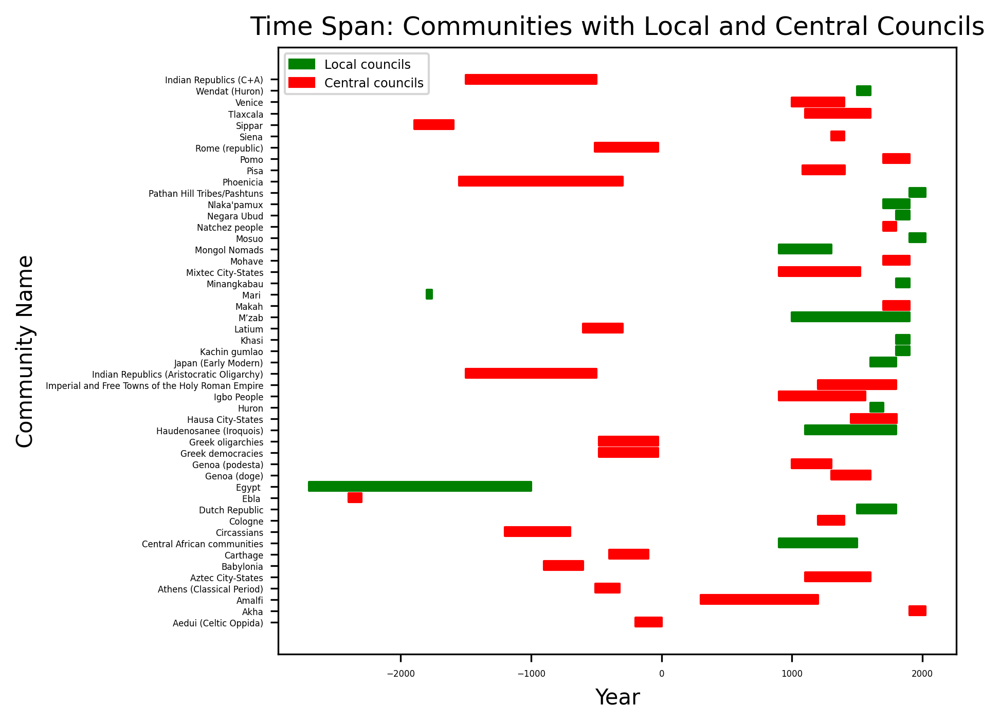

In [88]:
# create figure and plot
fig, ax = plt.subplots()
labels = []
for i, (
    start, 
    duration, 
    label, 
    is_local,
    is_central, 
) in enumerate(council_dates_tuples):
    if is_local:
        bar_color = 'green'
    elif is_central:
        bar_color = 'red'
    else:
        bar_color = 'grey' 
    
    labels.append(label)
    ax.broken_barh(
        [(start, duration)], 
        (i-0.4,0.8),
        color=bar_color
    )
    
# set yticks at the middle of the bars
ax.set_yticks(range(len(council_dates_tuples)))
ax.set_yticklabels(labels)
ax.tick_params(axis='both', which='major', labelsize=4)

ax.set_xlabel('Year')
ax.set_ylabel('Community Name')

plt.title('Time Span: Communities with Local and Central Councils')
# plt.figure(figsize=(80, 80))

# Create legend
red_patch = mpatches.Patch(color='green', label='Local councils')
yellow_patch = mpatches.Patch(color='red', label='Central councils')

ax.legend(
    handles=[
        red_patch,
        yellow_patch,
    ],
    loc='upper left',
    fontsize='xx-small'
)

plt.tight_layout()
plt.savefig('../v2-fig/fig-councils/timeline_councils.png')
plt.show()